# Data analysis: Velib

Author: O. Roustant, INSA Toulouse. January 2021.


We consider the ‘Vélib’ data set, related to the bike sharing system of Paris. The data are loading profiles of the bike stations over one week, collected every hour, from the period Monday 2nd Sept. - Sunday 7th Sept., 2014. The loading profile of a station, or simply loading, is defined as the ratio of number of available bikes divided by the number of bike docks. A loading of 1 means that the station is fully loaded, i.e. all bikes are available. A loading of 0 means that the station is empty, all bikes have been rent.

From the viewpoint of data analysis, the individuals are the stations. The variables are the 168 time steps (hours in the week). The aim is to detect clusters in the data, corresponding to common customer usages. This clustering should then be used to predict the loading profile.

In [1]:
rm(list = ls())   # erase everything, start from scratch!

# load the data from package funFEM

library(funFEM)
library(FactoMineR)
library(factoextra)
library(ggplot2)
data(velib)
warnings('off')
# help("velib")

Loading required package: MASS

Loading required package: fda

Loading required package: splines

Loading required package: Matrix

Loading required package: fds

Loading required package: rainbow

Loading required package: pcaPP

Loading required package: RCurl


Attaching package: ‘fda’


The following object is masked from ‘package:graphics’:

    matplot


Loading required package: elasticnet

Loading required package: lars

Loaded lars 1.2


Loading required package: ggplot2

Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa



In [4]:
# data preparation
x <- as.matrix(velib$data)
colnames(x) <- 1:ncol(x)
rownames(x) <- velib$names

n <- nrow(x)
stations <- 1:n 
coord <- velib$position[stations,]

# select exactly 7 days of data (we remove the first 13 dates)
dates <- 14:181
x <- x[stations, dates]
colnames(x) <- 1:length(dates)
mg <- x

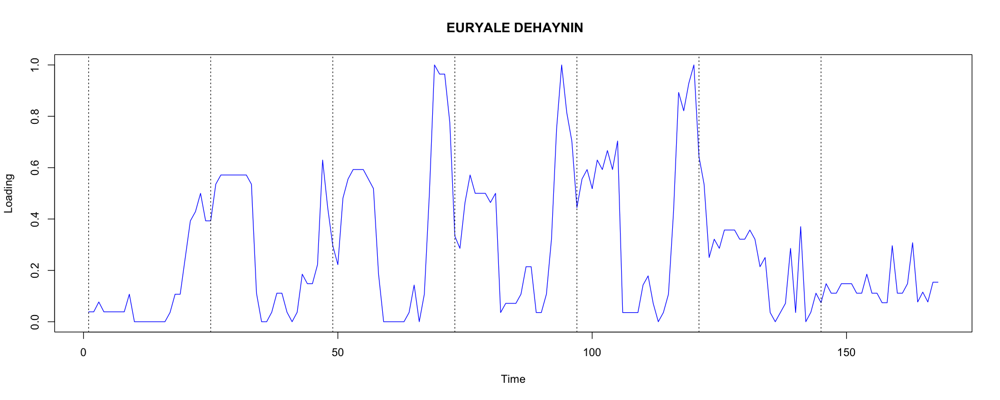

In [5]:
timeTick <- 1 + 24*(0:6)  # vector corresponding to the beginning of days
par(mfrow = c(1, 1))

options(repr.plot.width = 15, repr.plot.height = 6)

plot(x[1, ], col = "blue", type = "l", ylim = c(0, 1), 
     xlab = "Time", ylab = "Loading", main = rownames(x)[1])
abline(v = timeTick, lty = "dotted")
#axis(1,at=seq(5,181,6),labels=velib$dates[seq(5,181,6)],las=2)

In [6]:
# From now on, we use numbers instead of station names, 
# in order to simplify printing
rownames(x) <- 1:nrow(x)

# Descriptive statistics.

1. Draw a matrix of plots of size 4*4, corresponding to the first 16 stations. (Do not forget the vertical lines corresponding to days).

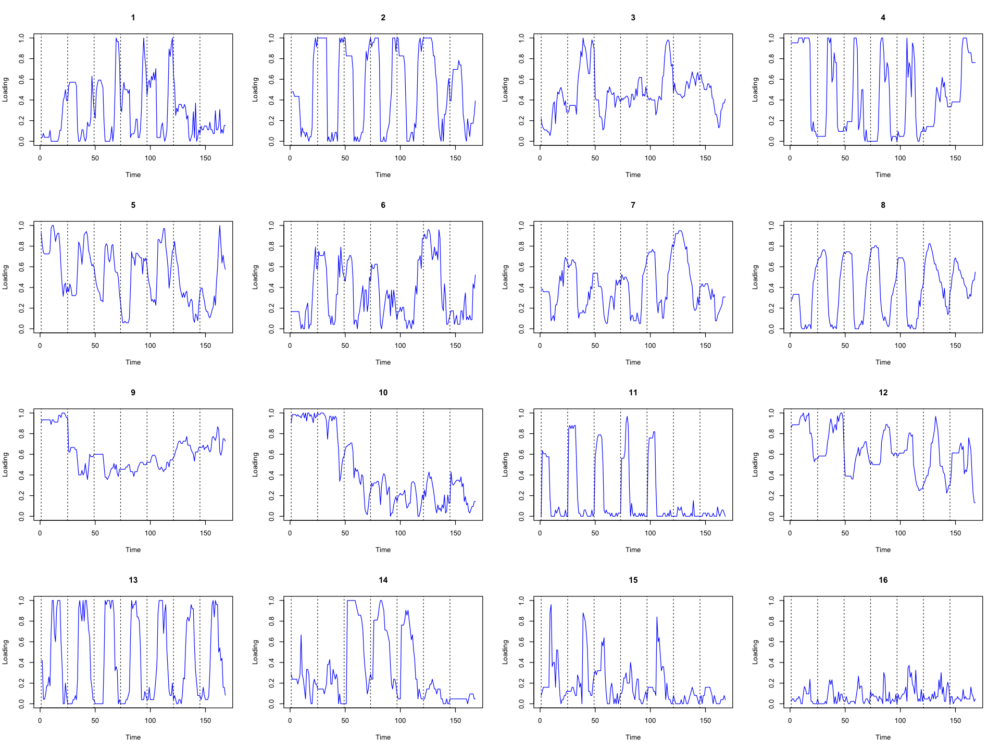

In [7]:
options(repr.plot.width = 16, repr.plot.height = 12)
par(mfrow=c(4,4))
for (i in 1:16){
    plot(x[i, ], col = "blue", type = "l", ylim = c(0, 1), 
     xlab = "Time", ylab = "Loading", main = rownames(x)[i])
    abline(v = timeTick, lty = "dotted")
}

2. Draw the boxplot of the variables, sorted in time order. 
What can you say about the distribution of the variables? 
Position, dispersion, symmetry?

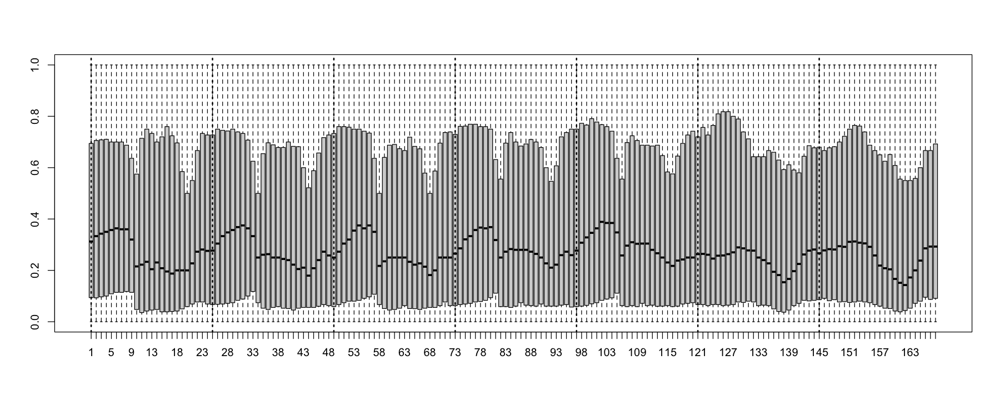

In [8]:
options(repr.plot.width = 15, repr.plot.height = 6)
boxplot(x[,1:ncol(x)])  #ou boxplot(x)
abline(v = timeTick, lty = "dotted",lwd = 2)

Position: The overall mean is around 0.3. The three quartiles (25, 50, 75) have a clear cycle and pattern on both weekdays and weekends.

Dispersion: The 25q is more stable and the 75q is more spread out. Because this contains all the stations, the values are more dispersed.

Symmetry: The average is closer to 25q.

3. Investigate the temporal correlation of the variables. 
For instance, for a given station, plot the loading at t+h versus loading at time t.
Visualize the correlation matrix by an image plot. Interpret the result.

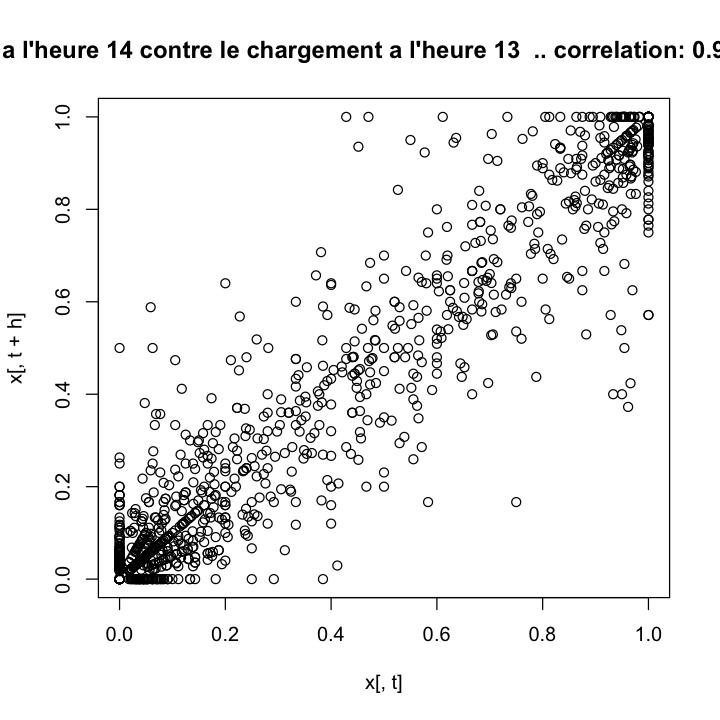

In [11]:
t <- 13
h <- 1
mycor <- cor(x[,t],x[,t+h])
options(repr.plot.width = 6, repr.plot.height = 6)
plot(x[,t],x[,t+h],main=paste("Chargement a l'heure",t+h,"contre le chargement a l'heure",t," .. correlation:",mycor))

The correlation is much smaller when the demand for rental cars is highly variable, such as during the morning rush. The correlation during the late night is approximately equal to 1.

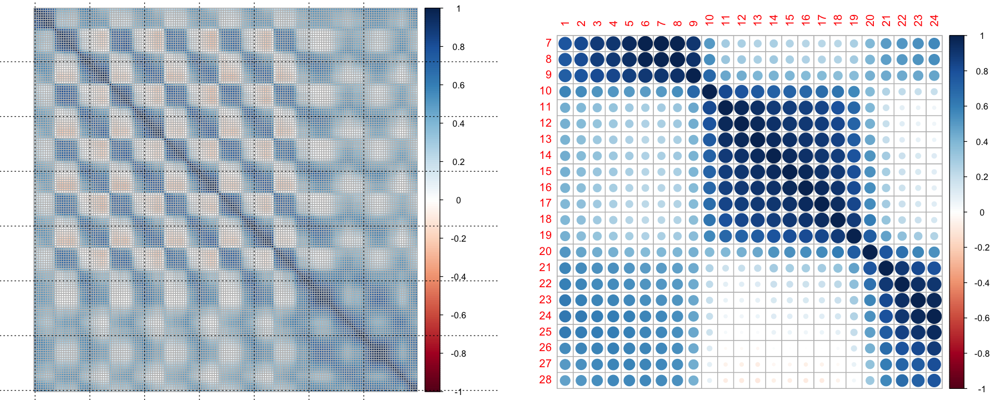

In [13]:
library("corrplot")
h <- 3
cormat <- cor(x)
options(repr.plot.width = 15, repr.plot.height = 6)
par(mfrow=c(1,2))
corrplot(cormat,tl.pos="n")
abline(v = timeTick, h=timeTick, lty = "dotted",lwd = 1)
corrplot(cormat[1+h:24+h,1:24])  #zoom d'un jour

4. Plot the stations coordinates on a 2D map (latitude versus longitude). Use a different color for stations which are located on a hill.

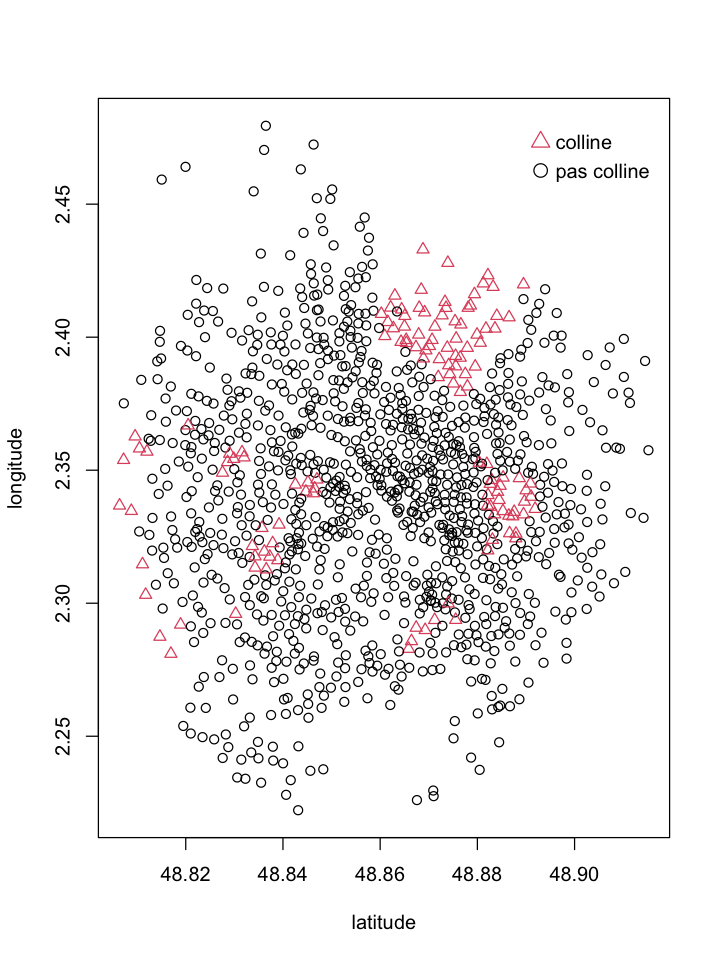

In [14]:
options(repr.plot.width = 6, repr.plot.height = 8)
#ifelse(velib$bonus==1,"red","blue")
plot(velib$position$latitude, velib$position$longitude,col=velib$bonus+1,
     xlab="latitude",ylab="longitude",pch=velib$bonus+1)
legend("topright", 
  legend = c("colline", "pas colline"), col = c(2,1), pch = c(2,1), bty = "n", pt.cex = 1.5, cex = 1, 
  text.col = "black", horiz = F , inset = c(0.05, 0.02))

5. Redo questions 1-3 for the subset of stations which are located on a hill. Same questions for those who are not. Comment?

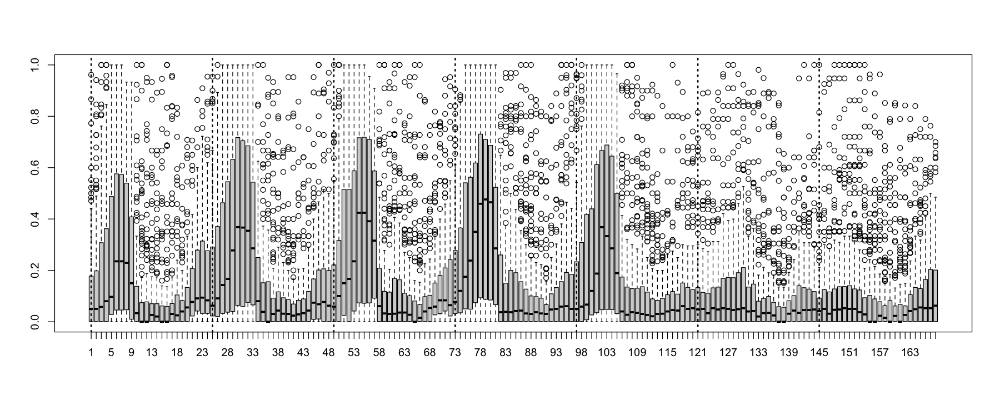

In [15]:
options(repr.plot.width = 15, repr.plot.height = 6)
stationHill <- which(velib$bonus ==1)
boxplot(x[stationHill,])
abline(v=timeTick,lty="dotted",lwd=2)

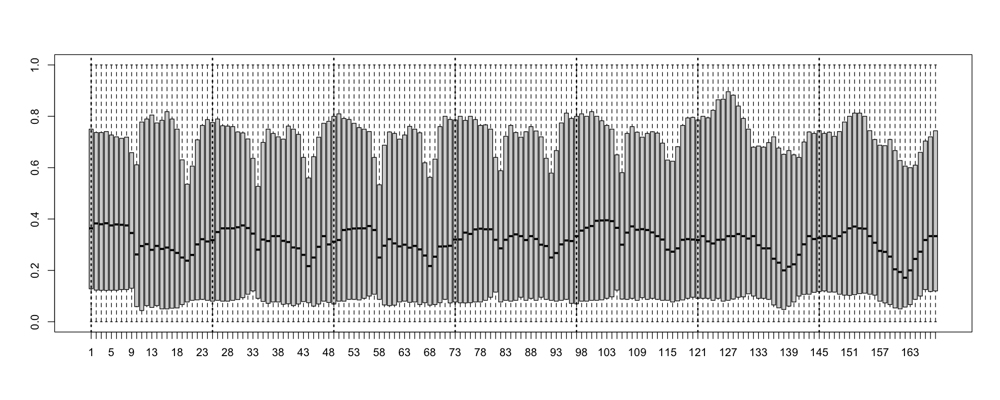

In [16]:
options(repr.plot.width = 15, repr.plot.height = 6)
stationHill <- which(velib$bonus == 0)
boxplot(x[stationHill,])  #ou boxplot(x)
abline(v = timeTick, lty = "dotted",lwd = 2)

Many bikes would have been returned on a weekday morning, so presumably they were people coming to work.

# Principal component analysis

1. Perform a PCA with package FactoMineR. Should the data be scaled?

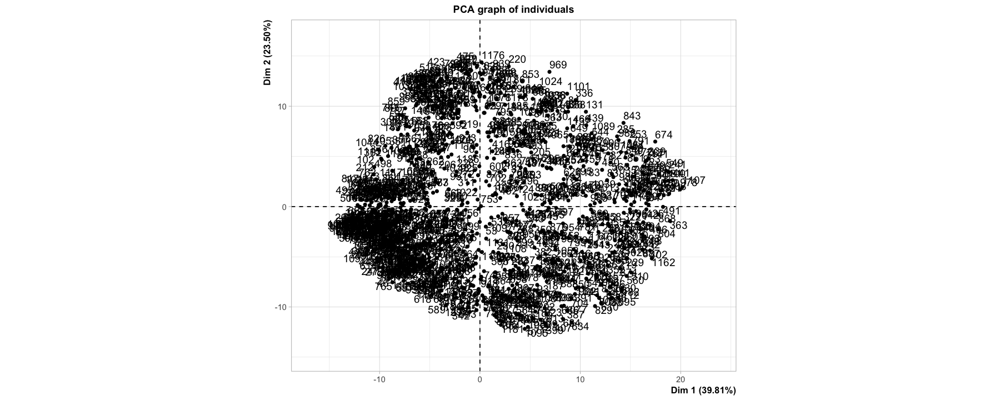

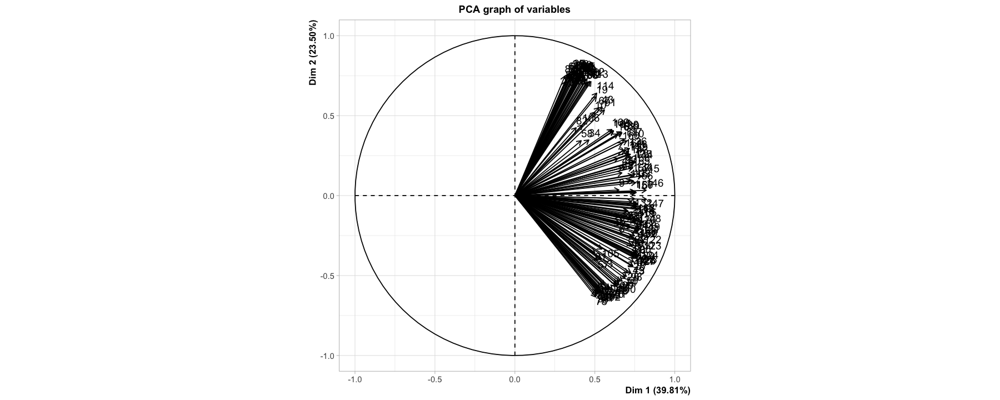

In [17]:
velib.pca <- PCA(x, scale=TRUE, ncp=15)

Data should be scaled, in this case the PCA graph is more legible.

2. Plot the percentage of variance explained by the first 15 components, as well as a boxplot of the coordinates of the indivuals on the 15 first principal axis. How many components can be kept?

In [18]:
get_eigenvalue(velib.pca)[1:15,]

,eigenvalue,variance.percent,cumulative.variance.percent
Dim.1,66.888963,39.8148588,39.81486
Dim.2,39.486446,23.5038371,63.31870
Dim.3,8.867649,5.2783627,68.59706
Dim.4,7.305326,4.3484080,72.94547
Dim.5,5.503113,3.2756624,76.22113
Dim.6,3.245742,1.9319894,78.15312
Dim.7,2.829095,1.6839854,79.83710
Dim.8,2.684309,1.5978028,81.43491
Dim.9,2.157416,1.2841760,82.71908
Dim.10,2.057260,1.2245596,83.94364


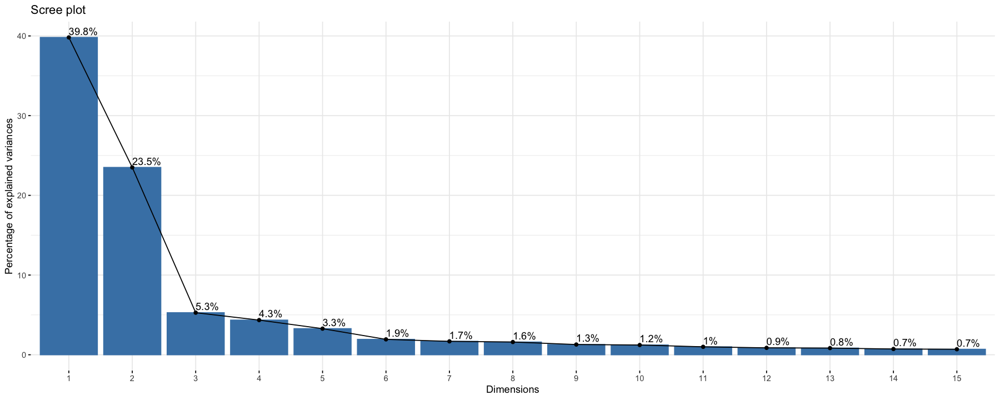

In [19]:
fviz_eig(velib.pca, addlabels = TRUE,ncp=15)

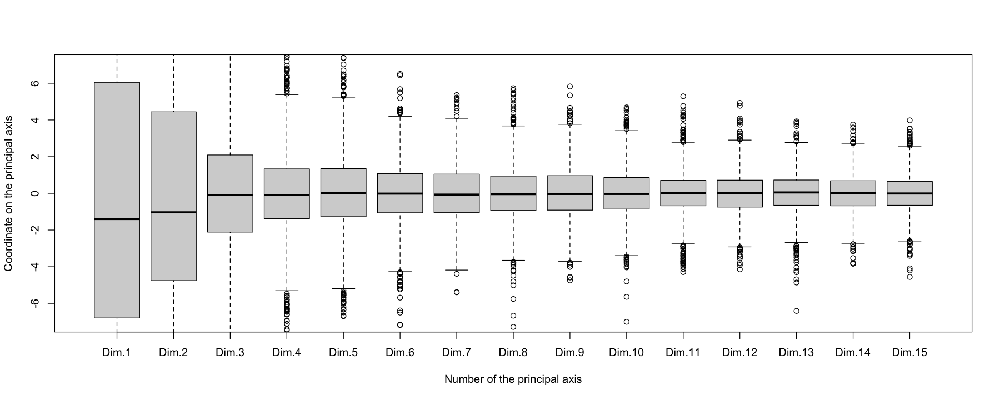

In [20]:
boxplot(velib.pca$ind$coord,ylim=c(-7,7),
        xlab = "Number of the principal axis",
        ylab = "Coordinate on the principal axis")

We keep 5 components.

3. Plot the coordinates of the first 4 principal components on different graphs. Interpret the result (remember that the original variables are time steps).

In [21]:
get_pca_var(velib.pca)$coord[, 1:4]

,Dim.1,Dim.2,Dim.3,Dim.4
1,0.7474314,0.02560724,0.052315543,-0.04483208
2,0.7301770,-0.03868910,0.125565507,-0.05920623
3,0.7032035,-0.09966322,0.193984521,-0.07462482
4,0.7012618,-0.12767592,0.207799074,-0.08728093
5,0.6779265,-0.16027615,0.247518775,-0.09057839
6,0.6514566,-0.18397519,0.275369253,-0.08854771
7,0.6534594,-0.16998014,0.278766436,-0.09376761
8,0.6553566,-0.13310366,0.279994400,-0.10516275
9,0.6506419,0.03506509,0.283335250,-0.13918886
10,0.5002716,0.52152198,0.275455190,-0.18454158


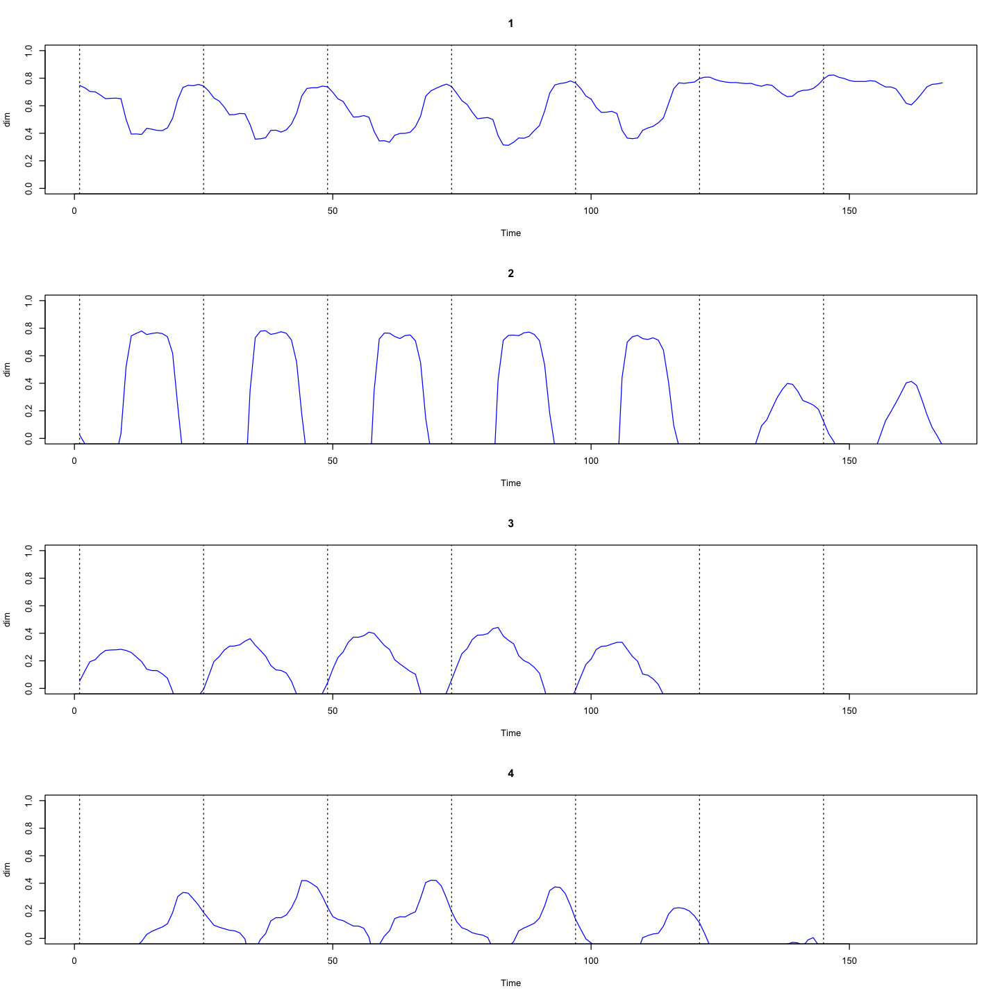

In [22]:
dim = get_pca_var(velib.pca)$coord
options(repr.plot.width = 12, repr.plot.height = 12)
par(mfrow=c(4,1))
for (i in 1:4){
    plot(dim[,i], col = "blue", type = "l", ylim = c(0, 1), 
     xlab = "Time", ylab = "dim", main = rownames(x)[i])
    abline(v = timeTick, lty = "dotted")
}

4. Plot the circle of correlation. Interpret the result.

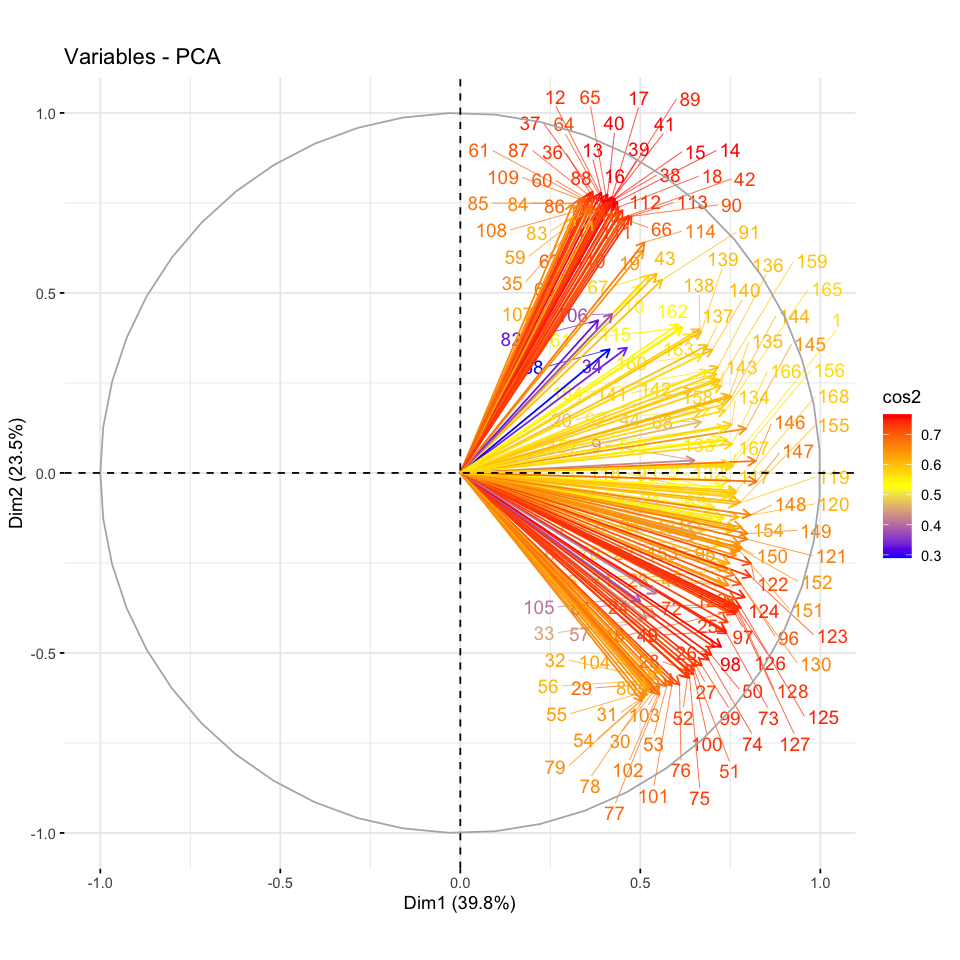

In [106]:
options(repr.plot.width=8,repr.plot.height=8)
fviz_pca_var(velib.pca,axes=c(1,2), col.var = "cos2",
            gradient.cols = c("blue","yellow","red"),
            repel = TRUE)


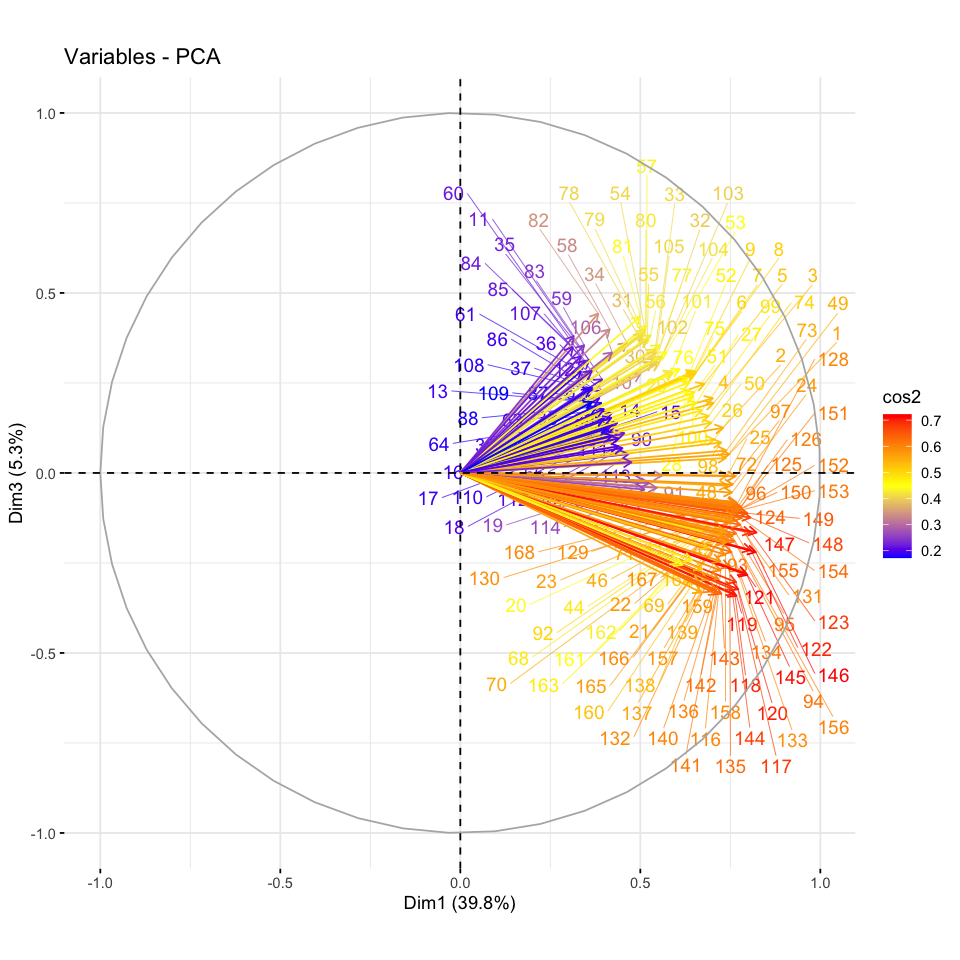

In [107]:
fviz_pca_var(velib.pca,axes=c(1,3), col.var = "cos2",
            gradient.cols = c("blue","yellow","red"),
            repel = TRUE)

Les heures correspondant aux flèches bleues sont principalement les nuits du week-end (0-3h), les flèches jaunes, qui se trouvent dans la même région que les flèches bleues mais plus longues, sont l'après-midi du jour de la semaine (13-17h), et les flèches rouges sous l'axe horizontal est principalement les matins du jour de la semaine (4-5h).

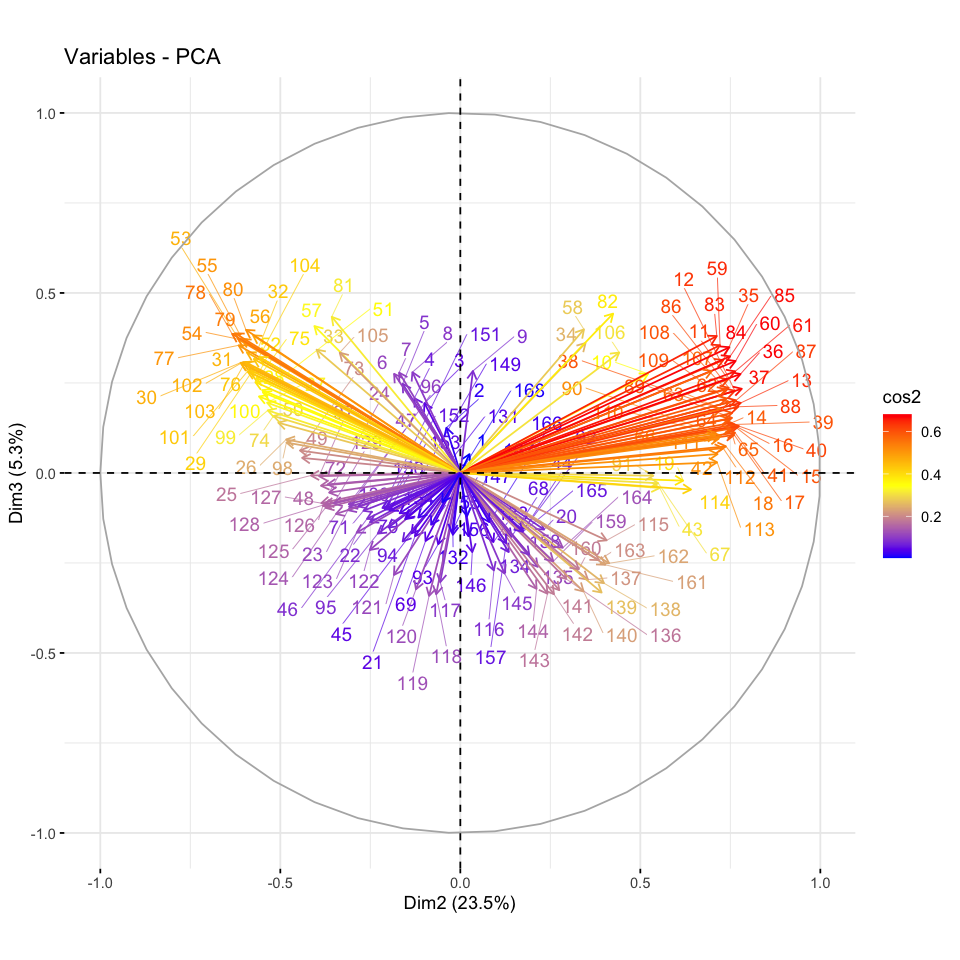

In [108]:
fviz_pca_var(velib.pca,axes=c(2,3), col.var = "cos2",
            gradient.cols = c("blue","yellow","red"),
            repel = TRUE)

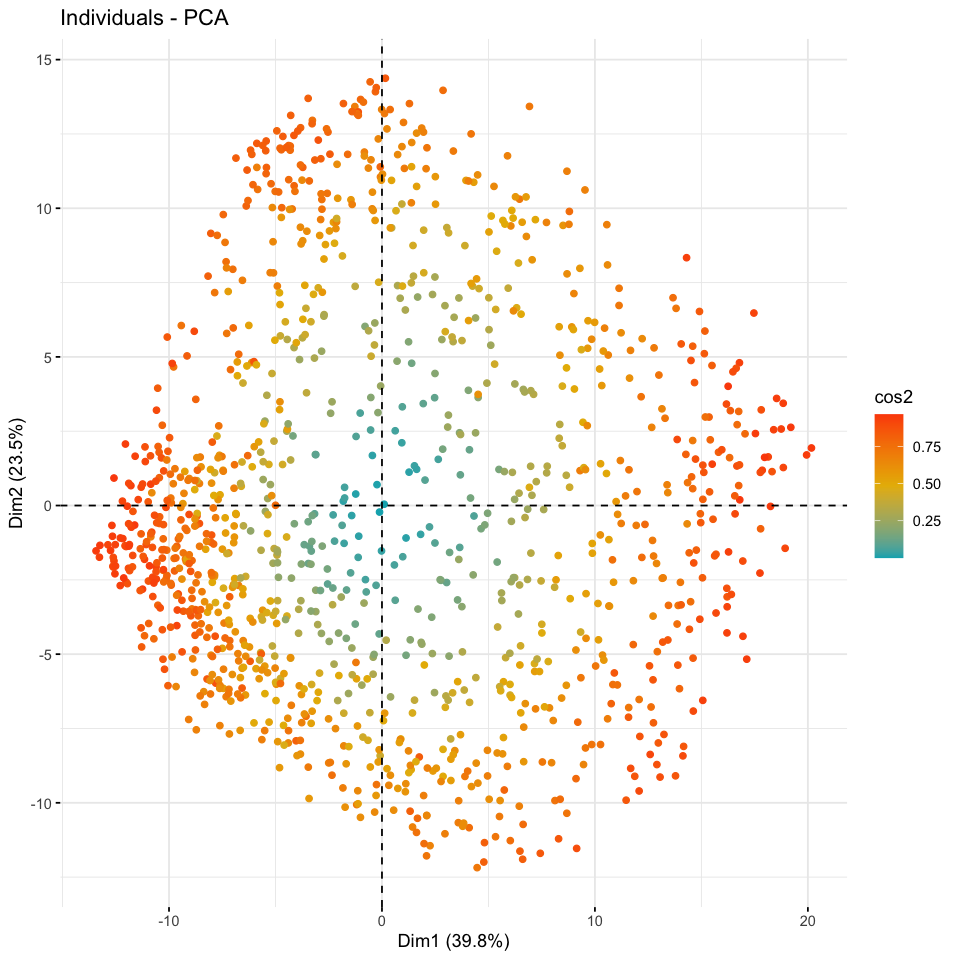

In [21]:
options(repr.plot.width = 8, repr.plot.height = 8)
fviz_pca_ind(velib.pca,geom="point",
             col.ind = "cos2", # Colorer par le cos2
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"), repel = FALSE)

5. Plot the individuals on the plan spanned by the first two coordinates. Interpret the result.

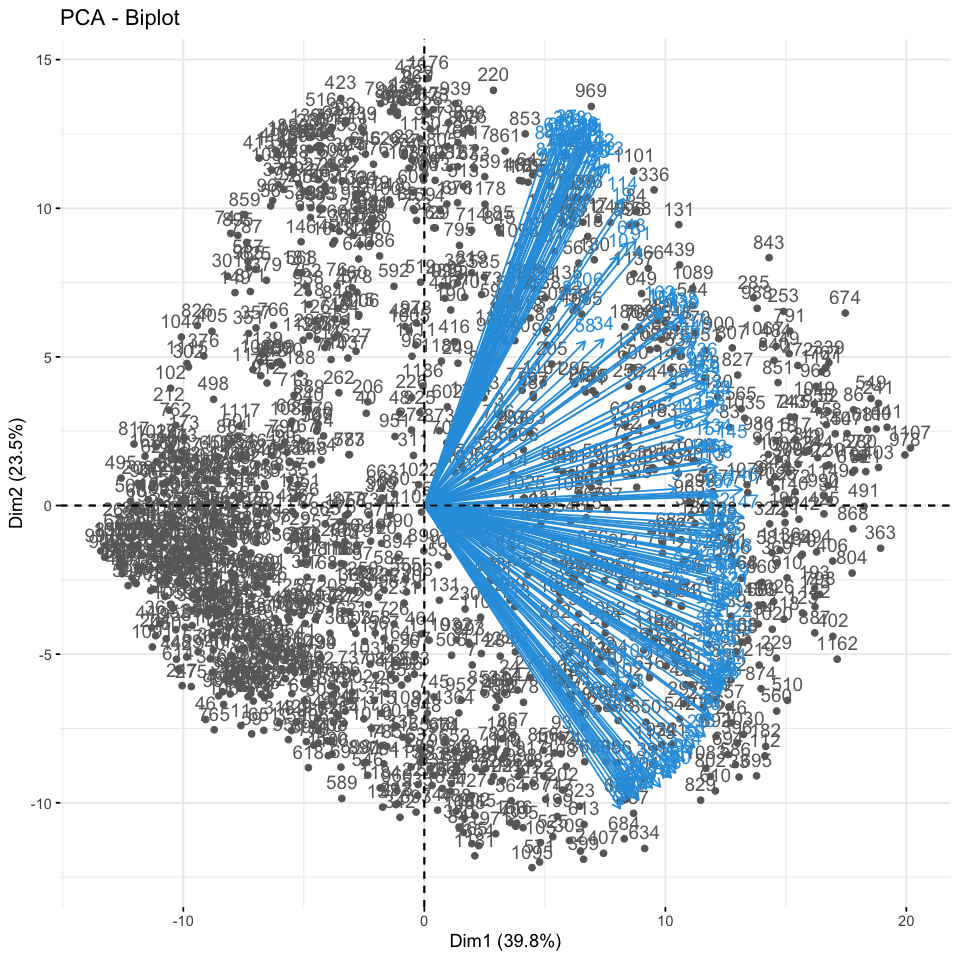

In [23]:
fviz_pca_biplot(velib.pca, repel = FALSE,
                col.var = "#2E9FDF",
                col.ind = "#696969")

6. Add the information brought by the variable qualitative variable 'bonus', indicating whether a station is located on a hill or not. In particular, where are located these stations on the graph of individuals? Is it surprising?

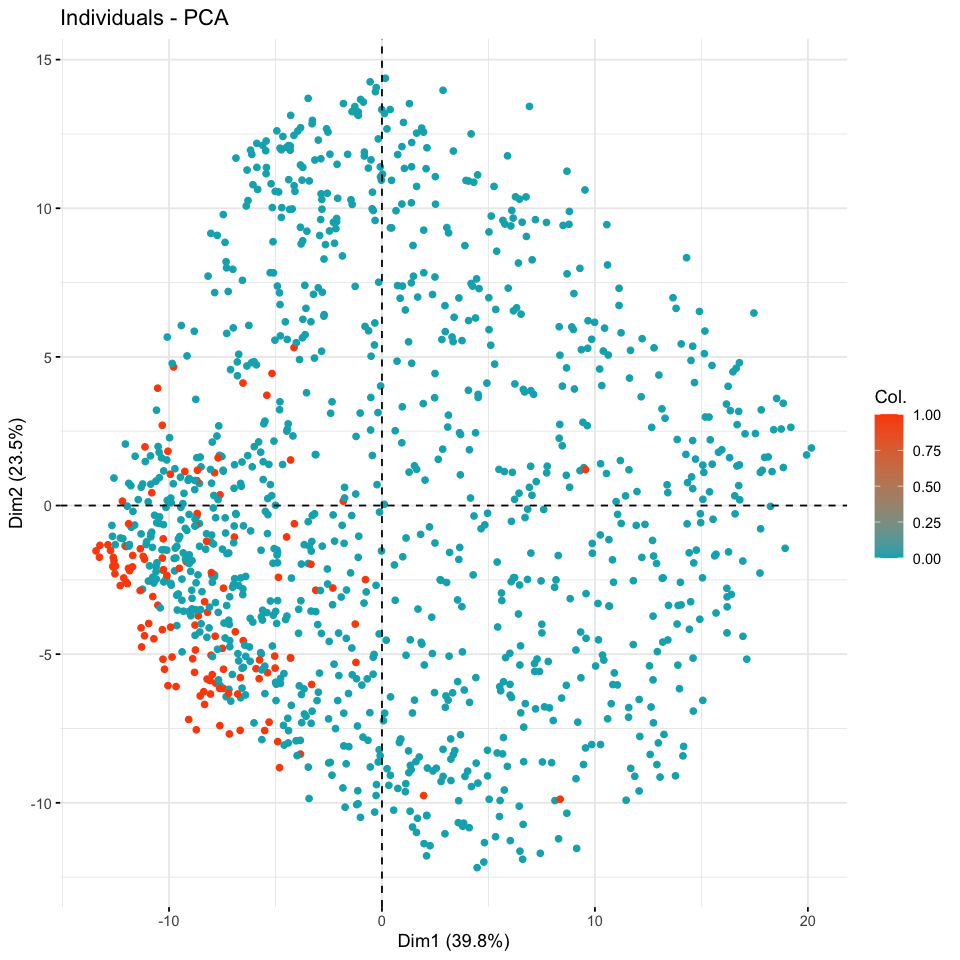

In [24]:
options(repr.plot.width = 8, repr.plot.height = 8)
fviz_pca_ind(velib.pca, label="none", col.ind = velib$bonus, 
             gradient.cols = c("#00AFBB","#FC4E07"),repel = FALSE)

Les 2 dimensions du site sur la colline sont concentrées dans le demi-axe négatif. 
Comme nous l'avons vu précédemment, le site sur la colline était rarement utilisé le week-end. Il est logique que la première dimension soit négative.

# Clustering

## kmeans on original dataset

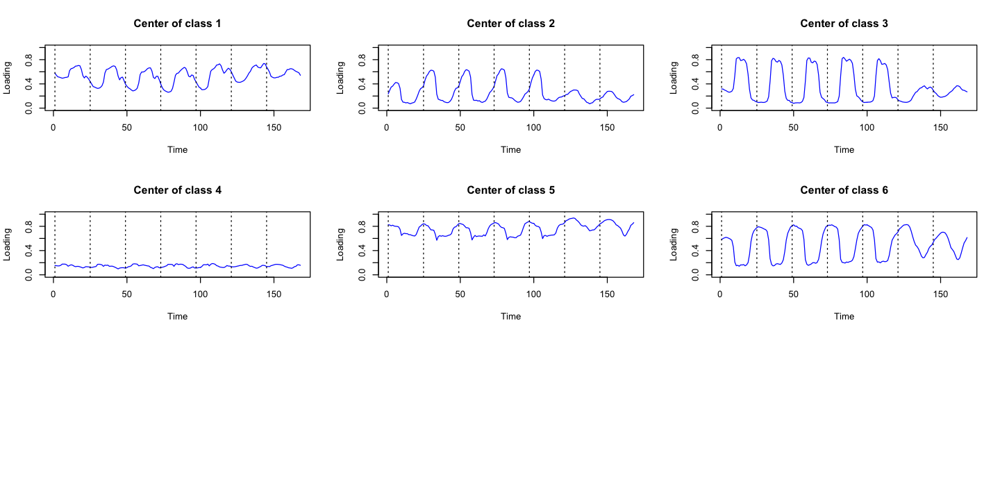

In [25]:
# kmeans
K <- 6
reskm <- kmeans(x, centers=K, nstart=10)
#x[whict(reskm$cluster==i),]
options(repr.plot.width=12,repr.plot.height=6)
par(mfrow = c(3,3))
# center of each class
for (i in 1:K){
    plot(reskm$centers[i,], col="blue",type="l",ylim=c(0,1),
        xlab="Time",ylab="Loading",main=paste("Center of class",i))
    abline(v=timeTick,lty="dotted")
}


Pour la quatrième et la cinquième classe, le nombre de vélos n'a pas beaucoup changé et les stations sont souvent dans un état de remplissage ou d'absence de vélos. Nous pourrions alors envisager de réduire le nombre de points d'ancrage pour vélos à ces stations et de les placer aux stations où le nombre de vélos varie davantage, comme pour la troisième classe.

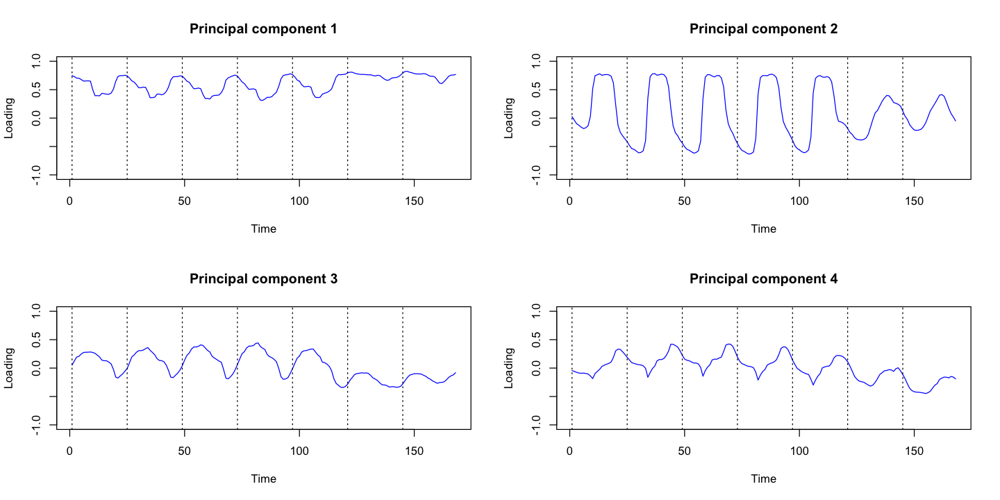

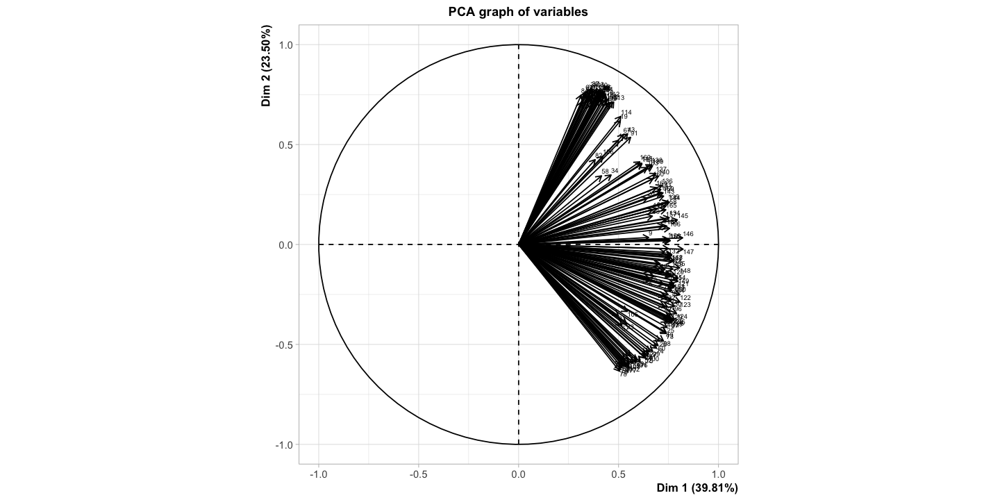

In [26]:
# composants principals
par(mfrow=c(2,2))
options(repr.plot.width=12,repr.plot.height=6)
for (i in 1:4){
    plot(velib.pca$var$coord[,i],ylim=c(-1,1),type="l",col="blue",
        ylab="Loading",xlab="Time",main=paste("Principal component",i))
    abline(v = timeTick,lty="dotted")
}
par(mfrow=c(1,1))
plot(velib.pca,axes=c(1,2),choix="var",cex=0.5,lwd=0.5)

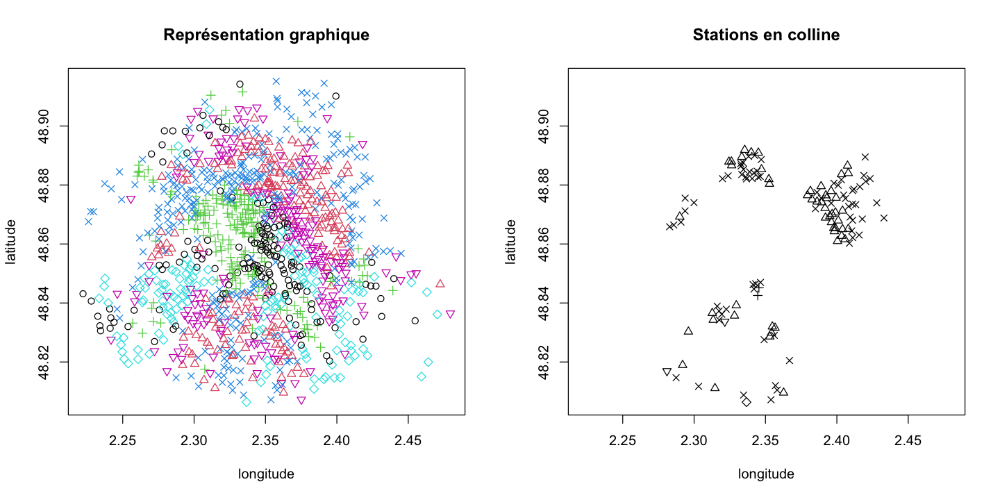

In [30]:
# Représentation graphique
coord <- velib$position[stations,]
par(mfrow = c(1,2))
options(repr.plot.width=12,repr.plot.height=6)
plot(coord,pch=reskm$cluster,col=reskm$cluster,main="Représentation graphique")
plot(coord,pch=reskm$cluster,col=velib$bonus[stations],main="Stations en colline")

Ce qui se situe sur une colline appartient majoritairement à la classe de bleu clair en forme carré.
Si on veut savoir le comportement de cette classe en bleu clair, on peut aller regarder les stations en colline.

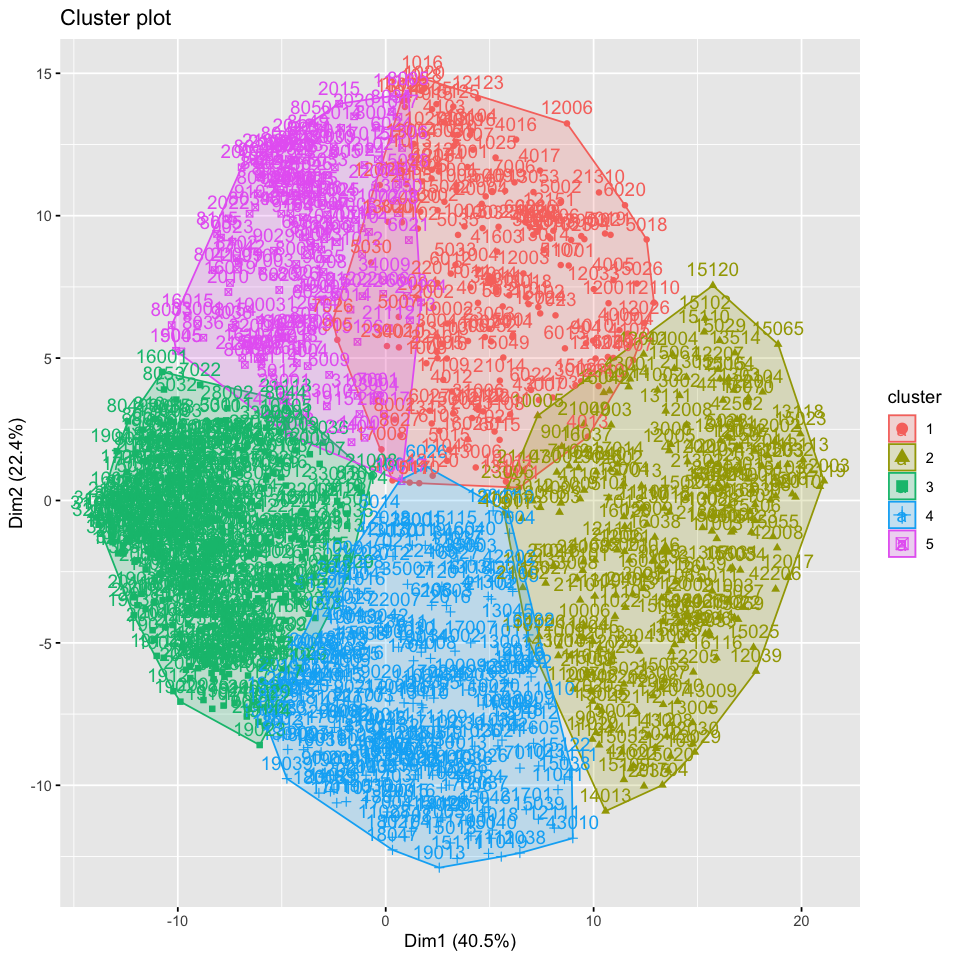

In [21]:
xbrut <- as.matrix(velib$data)
kmbrut <- kmeans(xbrut,5, nstart=10)
options(repr.plot.width = 8, repr.plot.height = 8)
fviz_cluster(kmbrut,data=xbrut)

## Kmeans on a reduced basis

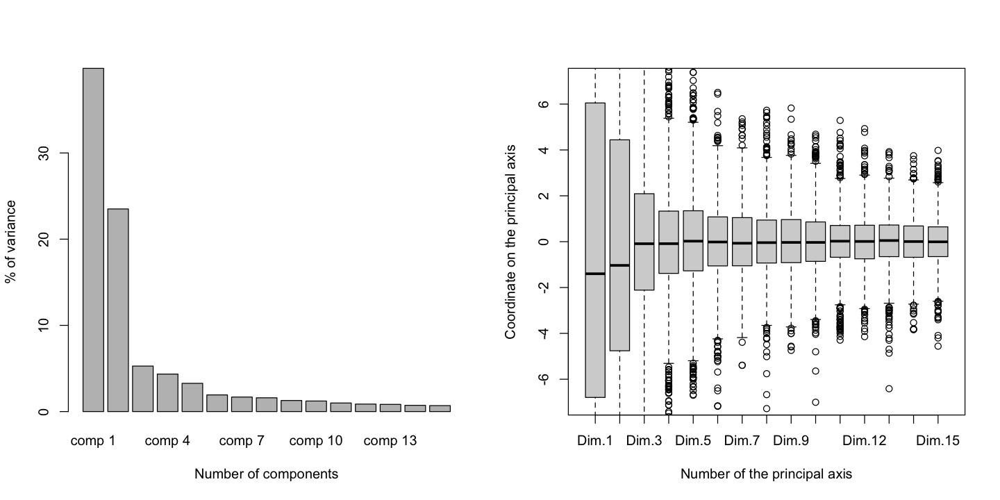

In [90]:
library(FactoMineR)
kpca <- velib.pca$ind$coord[, 1:5]
mpca <- PCA(x, scale.unit=TRUE, graph=FALSE, ncp=15)
par(mfrow=c(1,2))
options(repr.plot.width=12,repr.plot.height=6)
barplot(mpca$eig[1:15,2],xlab="Number of components",ylab="% of variance")
boxplot(mpca$ind$coord,ylim=c(-7,7),
        xlab="Number of the principal axis",
        ylab="Coordinate on the principal axis")

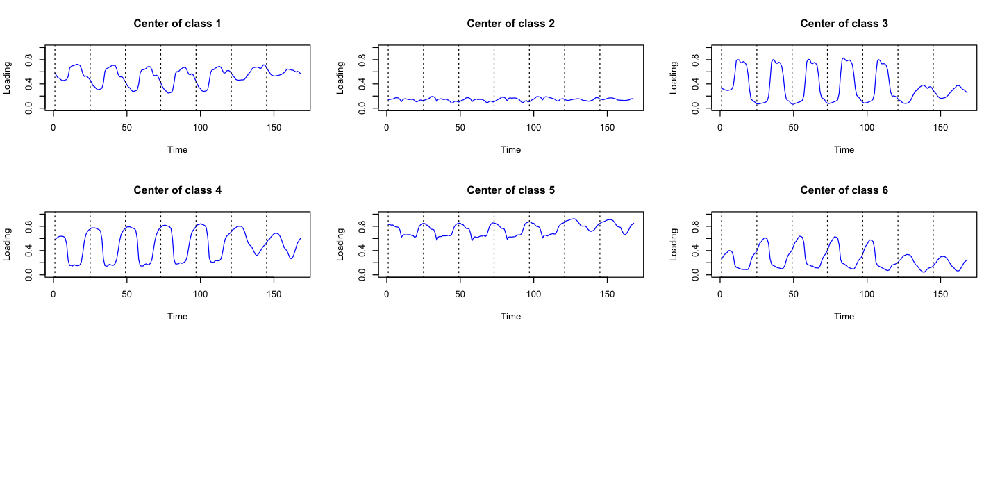

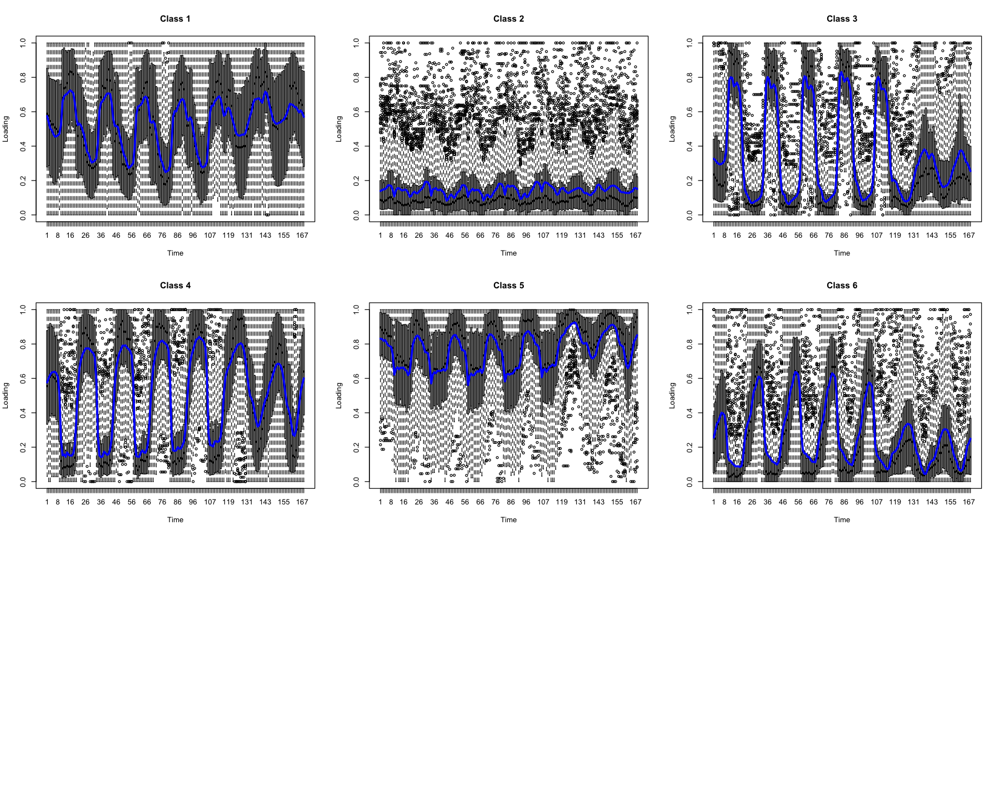

In [32]:
# Clustering on the scores of the principal components 
p <- 6
reskmPCA <- kmeans(velib.pca$ind$coord[, 1:p], centers = K, nstart = 10)   # use the same as previously chosen
reskmPCAcenters <- matrix(nrow = ncol(x), ncol = K)
for (i in 1:K){
    reskmPCAcenters[, i] <- mpca$call$centre + mpca$call$ecart.type * mpca$var$coord[, 1:p] %*% (as.matrix(reskmPCA$centers[i, ], ncol = 1) / sqrt(mpca$eig[1:p, 1])) # coord. in the orig. space
}

par(mfrow = c(3,3))
for(i in 1:K){
  plot(reskmPCAcenters[,i], col = "blue", type = "l", ylim = c(0,1), xlab = "Time", ylab = "Loading", main = paste("Center of class", i))
  abline(v = timeTick, lty = "dotted")
}

par(mfrow = c(3,3))
options(repr.plot.width = 15, repr.plot.height = 12)
for(i in 1:K){
  boxplot(x[which(reskmPCA$cluster==i), ], xlab = "Time", ylab = "Loading", main = paste("Class", i))
  lines(reskmPCAcenters[,i], col = "blue", lwd =3)
}

   
      1   2   3   4   5   6
  1 147   1   4   0   2   1
  2   0 210   1   2   0   0
  3   0   0 185   0   0   0
  4   0   3   2 291   0   0
  5   0   0   0   0 147   0
  6   0   3   0   0   0 190

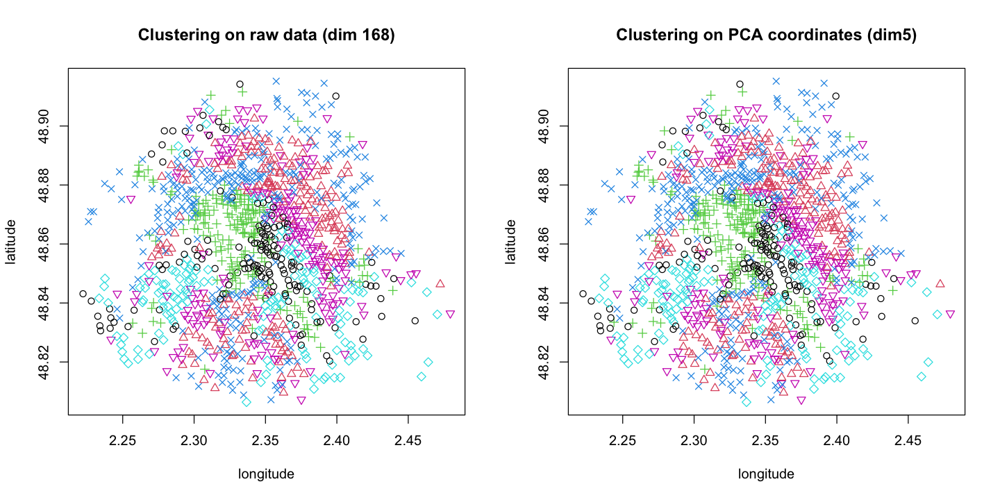

In [34]:
#comparaison des deux clusterings 

tabCompCluster <- table(reskm$cluster,reskmPCA$cluster)
#tabCompCluster
clusterPerm <- apply(tabCompCluster,2,which.max)
#clusterPerm
table(reskm$cluster,clusterPerm[reskmPCA$cluster])
par(mfrow = c(1,2))
options(repr.plot.width=12,repr.plot.height=6)
plot(coord,pch=reskm$cluster,col=reskm$cluster,main="Clustering on raw data (dim 168)")
plot(coord, pch=clusterPerm[reskmPCA$cluster],col = clusterPerm[reskmPCA$cluster], main= "Clustering on PCA coordinates (dim5)")



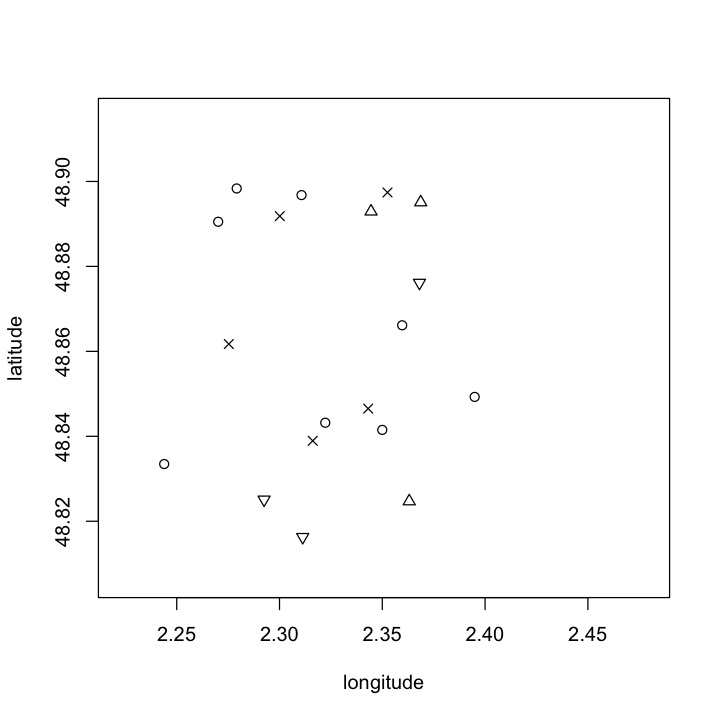

In [36]:
options(repr.plot.width=6,repr.plot.height=6)
plot(coord, pch=1*(reskm$cluster),col =(reskm$cluster!=clusterPerm[reskmPCA$cluster]) )
# Les erreurs de classification ne sont pas regroupées dans une classe particulière.

In [37]:
n = sum(reskm$cluster!=clusterPerm[reskmPCA$cluster])
m = sum(reskm$cluster==clusterPerm[reskmPCA$cluster])
print(n/m)

[1] 0.01623932


## Classification  hiérarchique sur données brutes

In [38]:
library(MASS)

In [39]:
# données bruts 
# centrage réduction des données, pour éviter que variables à forte variance
cah_cr <- scale(x,center=T,scale=T)
cah_d <- dist(cah_cr,method="euclidean")

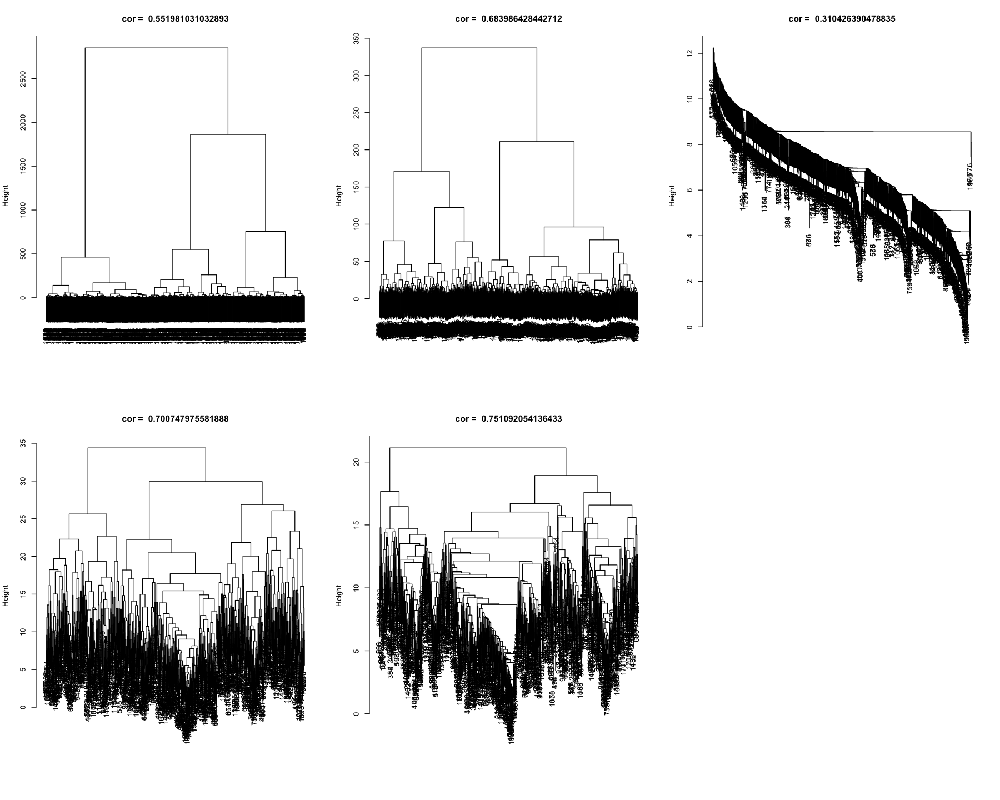

In [40]:
# comparaison méthod hclust
cah_clustward <- hclust(cah_d,method="ward.D")
cah_clustward2 <- hclust(cah_d,method="ward.D2")
cah_clustsingle <- hclust(cah_d,method="single")
cah_clustcomplete <- hclust(cah_d,method="complete")
cah_clustaverage <- hclust(cah_d,method="average")
par(mfrow = c(2,3))
options(repr.plot.width = 15, repr.plot.height = 12)
plot(cah_clustward,main=paste("cor = ",cor(cophenetic(cah_clustward),cah_d)),sub="",xlab="")
plot(cah_clustward2,main=paste("cor = ",cor(cophenetic(cah_clustward2),cah_d)),sub="",xlab="")
plot(cah_clustsingle,main=paste("cor = ",cor(cophenetic(cah_clustsingle),cah_d)),sub="",xlab="")
plot(cah_clustcomplete,main=paste("cor = ",cor(cophenetic(cah_clustcomplete),cah_d)),sub="",xlab="")
plot(cah_clustaverage,main=paste("cor = ",cor(cophenetic(cah_clustaverage),cah_d)),sub="",xlab="")

# commentaire : on devait chosir le méthode avec corrélation cophénétique la plus grande.
# Mais pour moi ward.D est le meilleur puisque des classes sont plus éloignés.
bestm = "ward.D"

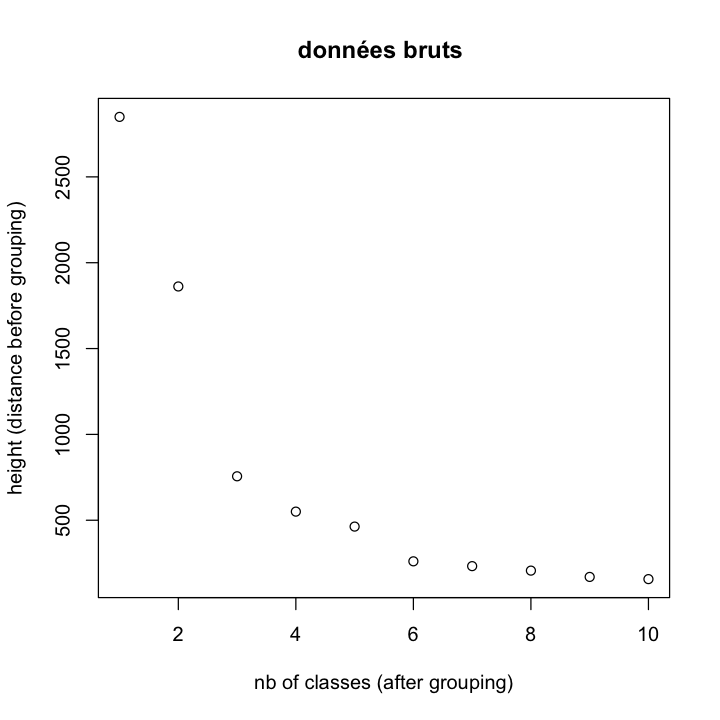

In [41]:
cah_clust <- hclust(cah_d,method=bestm)
#plot(cah_clust)
options(repr.plot.width = 6, repr.plot.height =6)
plot(rev(cah_clust$height)[1:10], main="données bruts ",
     xlab = "nb of classes (after grouping)",
     ylab = "height (distance before grouping)")
# On prend 6 classes.

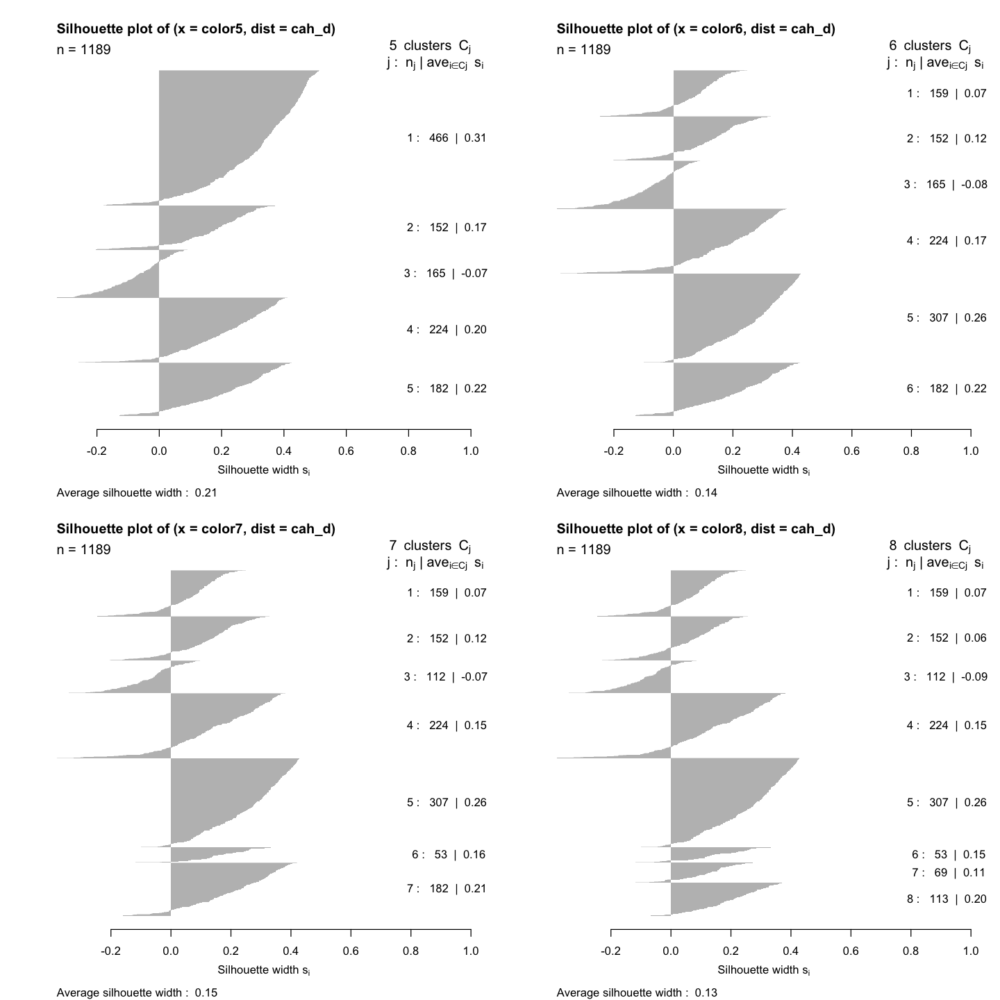

In [46]:
library(cluster)
color5=cutree(cah_clust,k=5)
color6=cutree(cah_clust,k=6)
color7=cutree(cah_clust,k=7)
color8=cutree(cah_clust,k=8)
par(mfrow = c(2,2))
options(repr.plot.width=12,repr.plot.height=12)
plot(silhouette(color5,cah_d))
plot(silhouette(color6,cah_d))
plot(silhouette(color7,cah_d))
plot(silhouette(color8,cah_d))

# le troisieme classe est toujour horrible

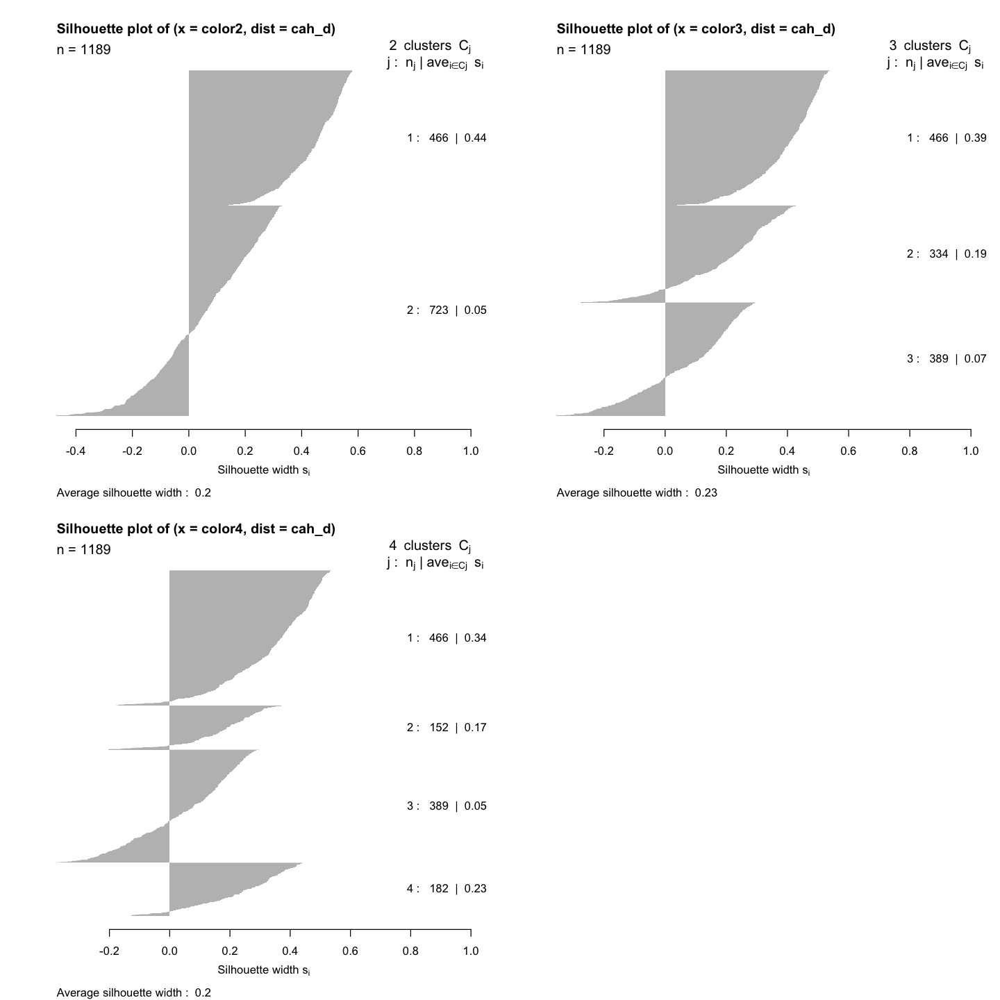

In [47]:
color2=cutree(cah_clust,k=2)
color3=cutree(cah_clust,k=3)
color4=cutree(cah_clust,k=4)
par(mfrow = c(2,2))
options(repr.plot.width=12,repr.plot.height=12)

plot(silhouette(color2,cah_d))
plot(silhouette(color3,cah_d))
plot(silhouette(color4,cah_d))

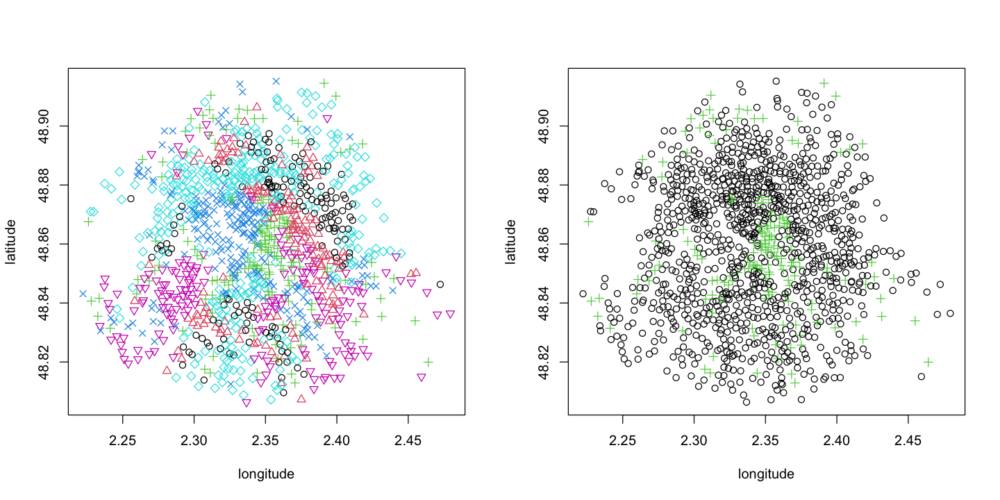

In [72]:
K <- 6 # nb de classe
par(mfrow = c(1,2))
options(repr.plot.width=12,repr.plot.height=6)
class <- cutree(cah_clust, K)
plot(coord, type = "p", col = class,pch = class)
plot(coord, type = "p", col = (class==3)*3 + (class!=3)*1,pch = (class==3)*3 + (class!=3)*1)
# idée: analyser la raison que la troisième classe est toujours mal classée

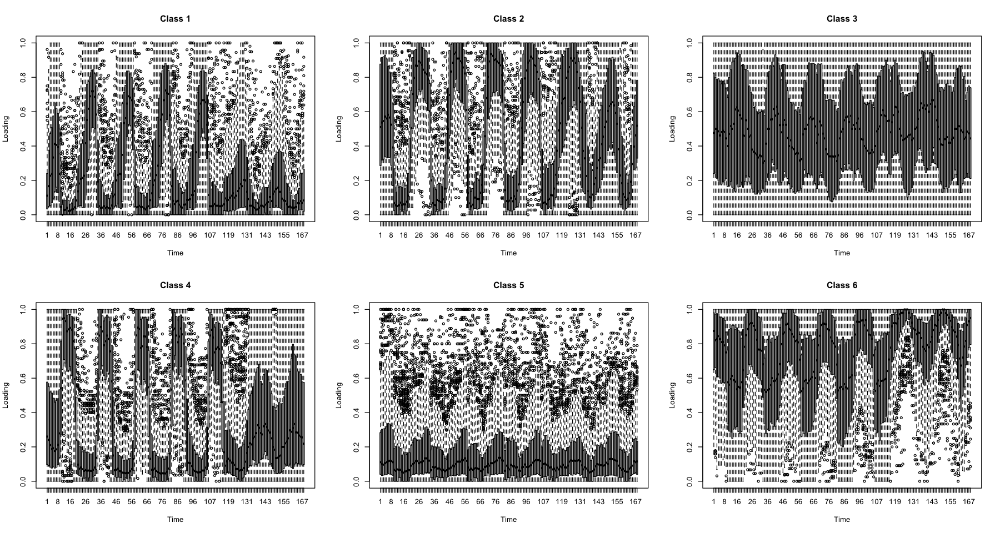

In [61]:
par(mfrow = c(2,3))
options(repr.plot.width=15,repr.plot.height=8)
for(i in 1:K){
  boxplot(x[which(class==i), ], xlab = "Time", ylab = "Loading", main = paste("Class", i))
}
# Cela ne serait pas surprenant. 
# La troisième classe fluctue tout simplement autour de 0,5 et est susceptible d'être considérée comme celle de l'autre classe.

## Classification  hiérarchique avec PCA

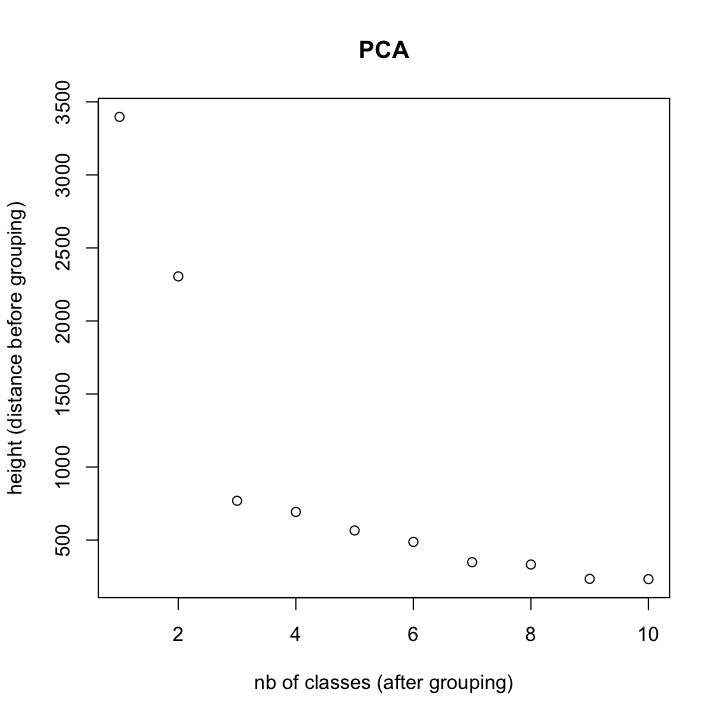

In [62]:
p = 5
cahpca <- velib.pca$ind$coord[, 1:p]
#plot(cah_pca)
cahpca_clust <- hclust(dist(cahpca), method = bestm)
classpca <- cutree(cahpca_clust, K)
options(repr.plot.width=6,repr.plot.height=6)
plot(rev(cahpca_clust$height)[1:10], main="PCA",
     xlab = "nb of classes (after grouping)",
     ylab = "height (distance before grouping)")
# Plutôt 7 classes selon le schéma, mais pour comparer avec de résultats précedents, on fait 6 classes.

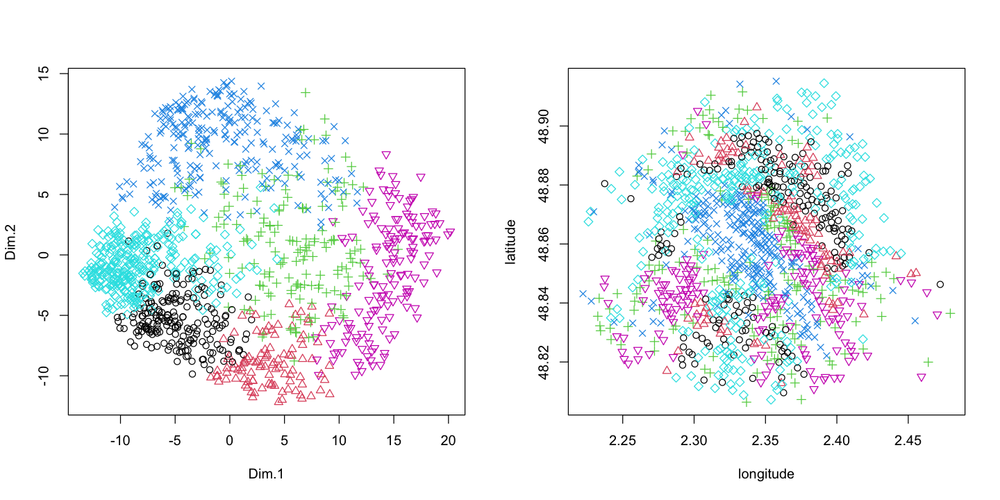

In [73]:
par(mfrow = c(1,2))
options(repr.plot.width=12,repr.plot.height=6)
plot(cahpca, type = "p", col = classpca, pch = classpca)
plot(coord, type = "p", col = classpca,  pch = classpca)

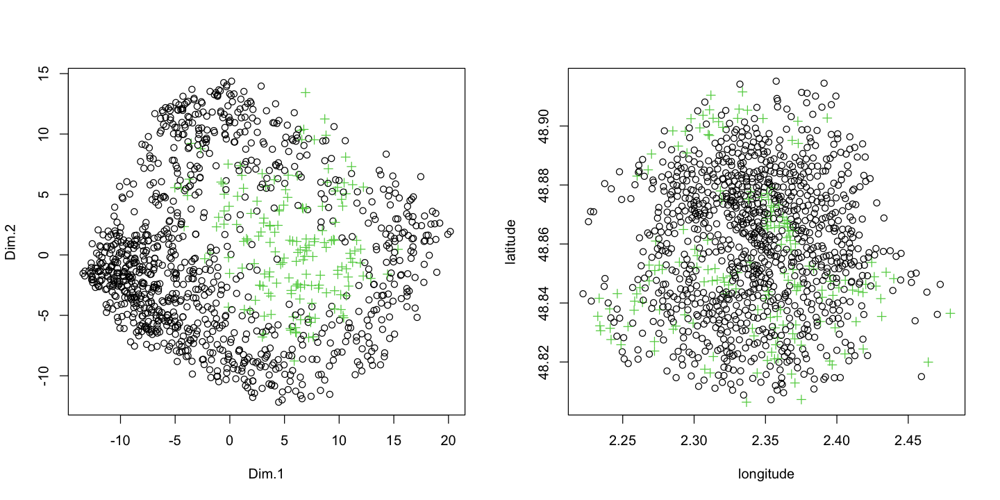

In [75]:
par(mfrow = c(1,2))
options(repr.plot.width=12,repr.plot.height=6)
plot(cahpca, type = "p", col = (classpca==3)*3+(classpca!=3), pch = (classpca==3)*3+(classpca!=3))
plot(coord, type = "p", col = (classpca==3)*3+(classpca!=3), pch = (classpca==3)*3+(classpca!=3))
# Les classes trois se situent aux milieux du graph à gauch, càd avec une petite norme, pas représentative.
# Cohérent avec ce qu'on a eu en données brutes.

     
class   1   2   3   4   5   6
    1 138   2   3   1  15   0
    2  13  97  25   0   1  16
    3   2   1  78  58  24   2
    4   0   0  26 191   7   0
    5  48   0   0   7 252   0
    6   0   5  38   1   0 138

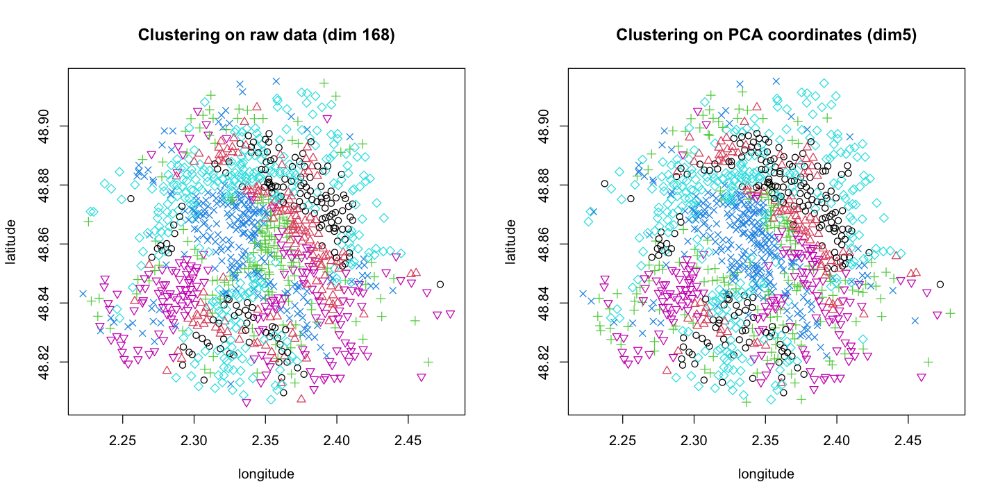

In [76]:
#comparaison des deux clusterings 

cah_tabCompCluster <- table(class,classpca)
cah_clusterPerm <- apply(cah_tabCompCluster,2,which.max)
cah_Comp <- table(class,cah_clusterPerm[classpca])
cah_Comp
par(mfrow = c(1,2))
options(repr.plot.width=12,repr.plot.height=6)
plot(coord, pch=class,col=class,main="Clustering on raw data (dim 168)")
plot(coord, pch=cah_clusterPerm[classpca],col = cah_clusterPerm[classpca], main= "Clustering on PCA coordinates (dim5)")
# la 3ième colonne et la 3ième ligne a une pire performance

In [41]:
# la proportion de classement différent
dif = sum(class!=cah_clusterPerm[classpca])
indif = sum(class==cah_clusterPerm[classpca])
print(dif/(dif+indif))
# 295/894+295 

# il y a bcp plus de classement différent par rapport aux k-means. 
# CAH gère moins bien avec les classes trois, on dira qu'il a une variance plus grande ?

[1] 0.2481077


## Mélange gaussien sur données brutes

In [78]:
#install.packages("mclust")
options(repr.plot.width=8,repr.plot.height=8)
library(mclust)
#plot(scale(x))

Package 'mclust' version 5.4.7
Type 'citation("mclust")' for citing this R package in publications.



Best BIC values:
            EEE,1    EEV,1    EVE,1
BIC      250782.9 250782.9 250782.9
BIC diff      0.0      0.0      0.0

Classification table for model (EEE,1): 

   1 
1189 

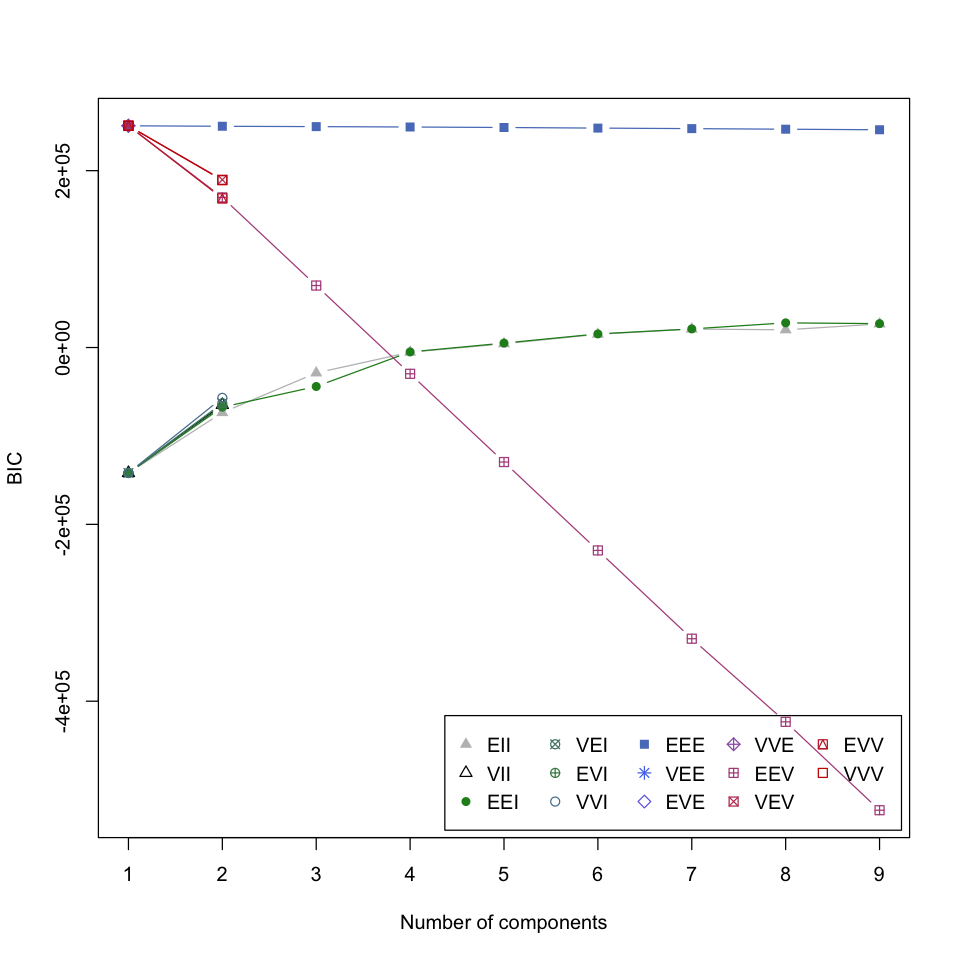

In [79]:
K <- 9
mgBIC <- mclustBIC(mg)
mgSummary <- summary(mgBIC,data = mg)
mgSummary
plot(mgBIC, G = 1:K, legendArgs = list(x = "bottomright", ncol = 5))
# On choisit le modele avec BIC plus grand possible
# Marche pas avec des données brutes

## Mélange gaussien avec PCA

In [82]:
mgpca <- velib.pca$ind$coord[, 1:5]
#plot(mgpca)

Best BIC values:
             VVE,7        VVE,6       VVE,9
BIC      -31315.83 -31376.39139 -31417.1012
BIC diff      0.00    -60.56077   -101.2705

Classification table for model (VVE,7): 

  1   2   3   4   5   6   7 
213 138 174 271 102 141 150 

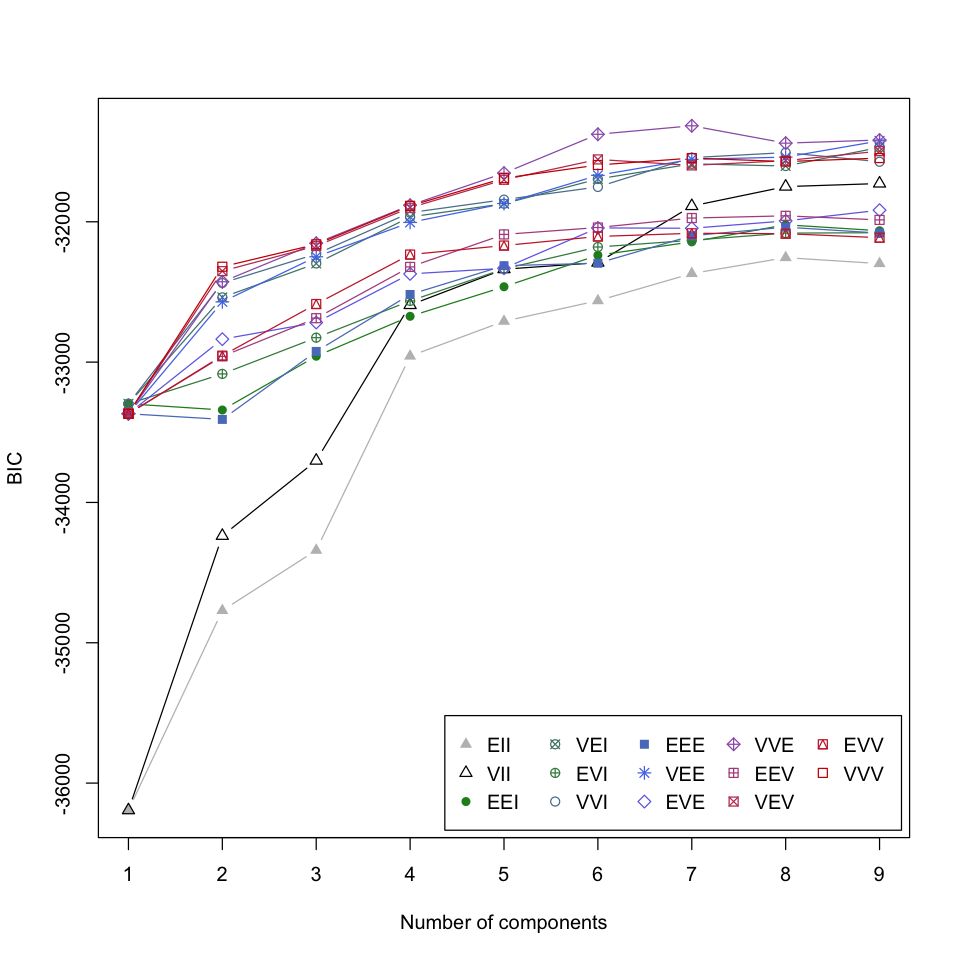

In [83]:
mgpcaBIC <- mclustBIC(mgpca)
mgpcaSummary <- summary(mgpcaBIC,data = mgpca)
mgpcaSummary
plot(mgpcaBIC, G = 1:K, legendArgs = list(x = "bottomright", ncol = 5))
# "VVE": ellipsoidal, equal orientation avec 7 classes

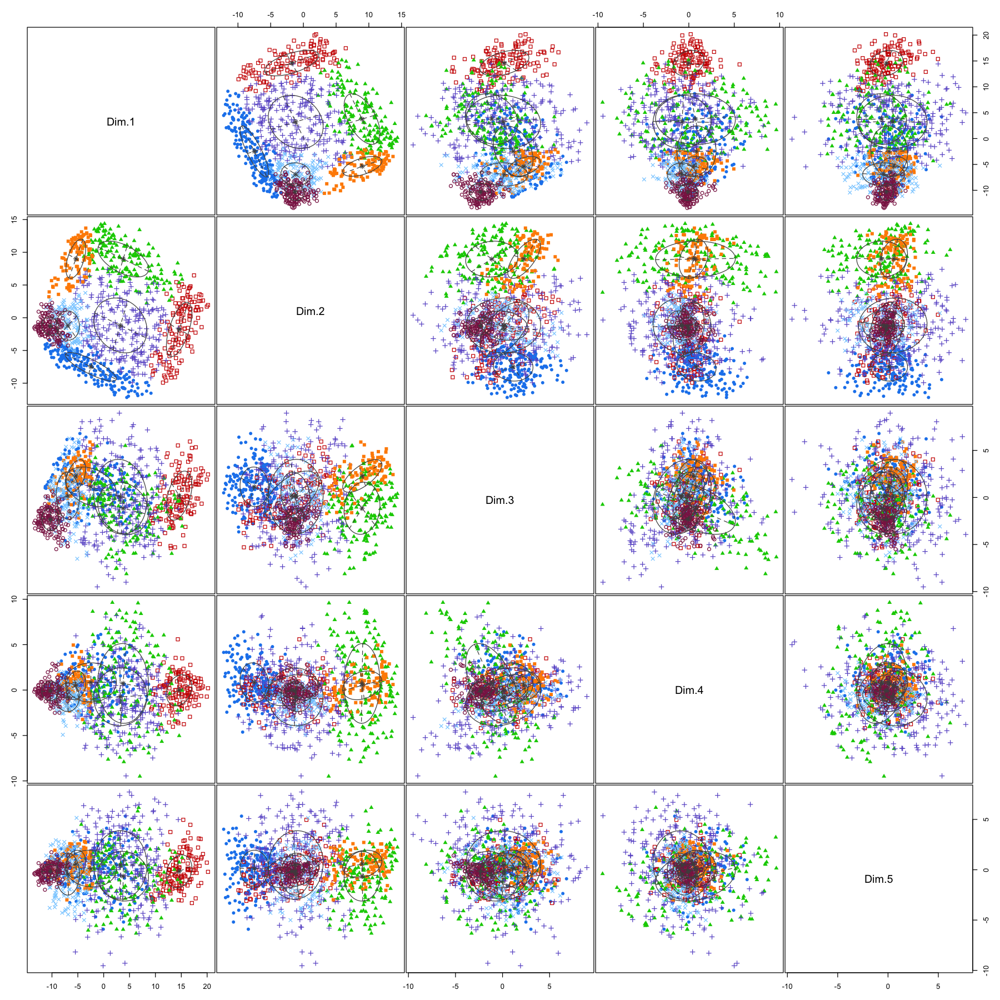

In [84]:
modpca <- Mclust(mgpca, x = mgpcaBIC)
#summary(modpca, parameters = TRUE)
options(repr.plot.width=15,repr.plot.height=15)
plot(modpca, what = "classification")

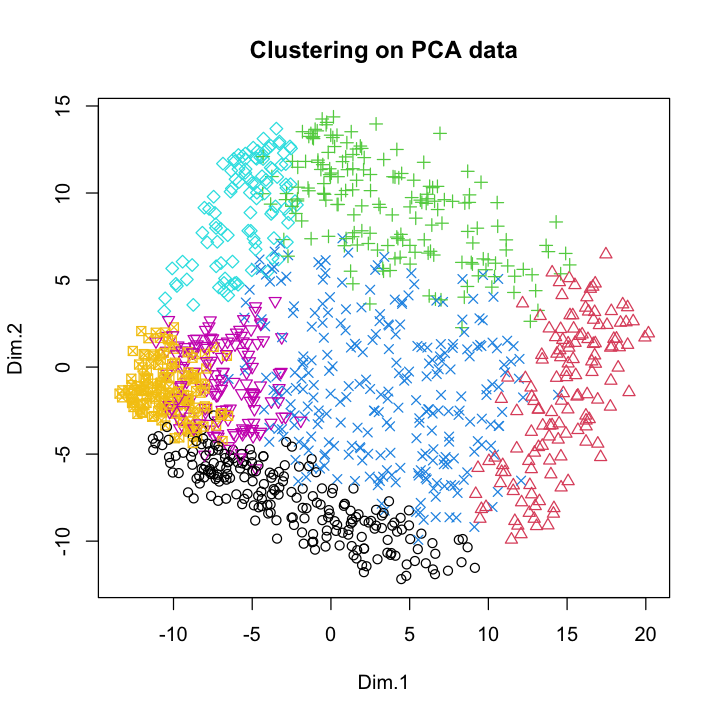

In [86]:
options(repr.plot.width=6,repr.plot.height=6)
plot(mgpca,pch=modpca$classification,col=modpca$classification,main="Clustering on PCA data")

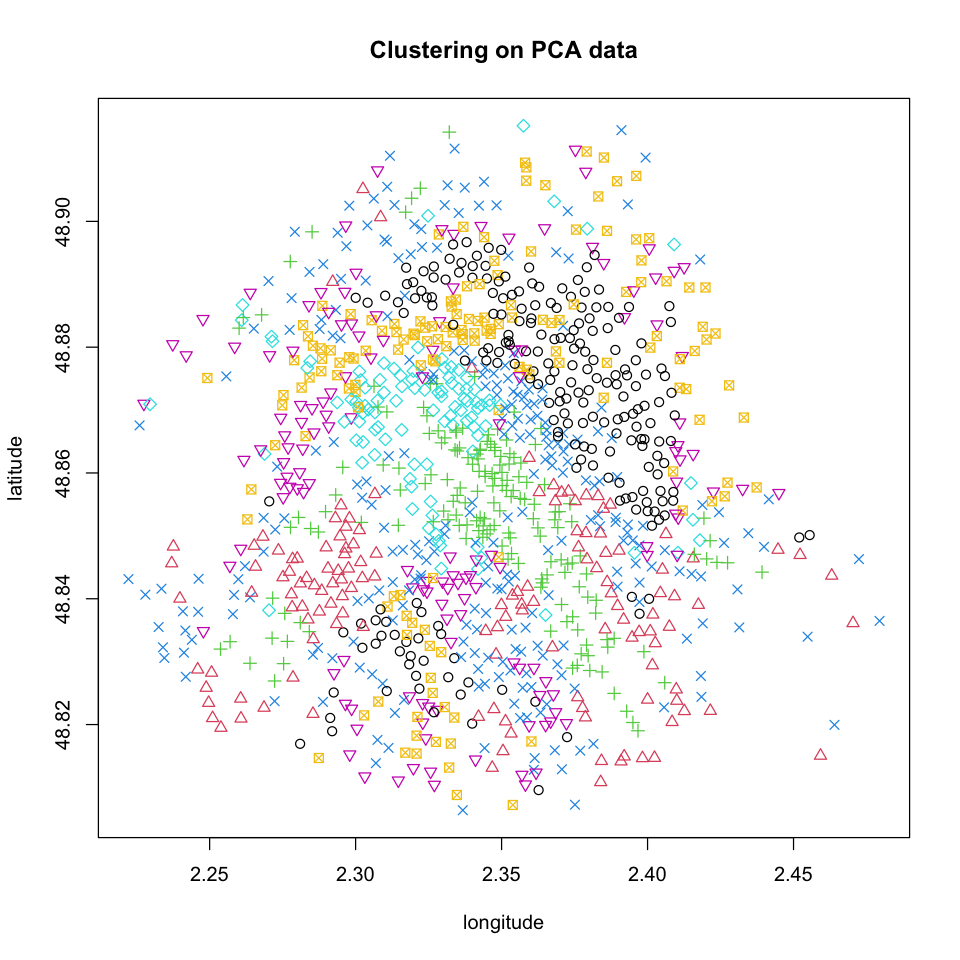

In [179]:
options(repr.plot.width=8,repr.plot.height=8)
plot(coord,pch=modpca$classification,col=modpca$classification,main="Clustering on PCA data on map")

## Comparaison pour les 3 méthodes

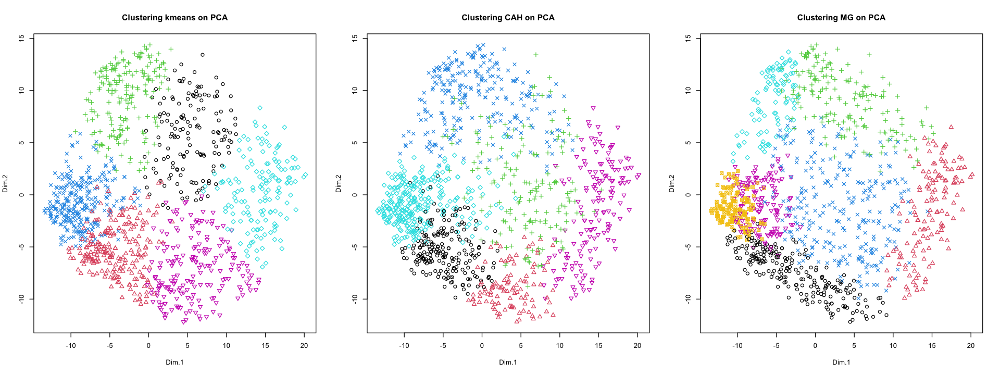

In [91]:
par(mfrow = c(1,3))
options(repr.plot.width=16,repr.plot.height=6)
plot(kpca, pch=clusterPerm[reskmPCA$cluster],col = clusterPerm[reskmPCA$cluster], main= "Clustering kmeans on PCA")
plot(cahpca, type = "p", col = classpca, pch = classpca,main="Clustering CAH on PCA")
plot(mgpca,pch=modpca$classification,col=modpca$classification,main="Clustering MG on PCA")